#### Norwegian University of Life Sciences
#### Course: INF250, Semester: Fall 2022

#### <font color='blue '>Student ID: 119049<font>   
--------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------------

## Table of contents
- <a href='#E1a'>Exercise 1</a>
    - <a href='#E1a'>Exercise 1 (a): Sharpening the image</a>
    - <a href='#E1b'>Exercise 1 (b): Canny filter on sharpened & unsharpened image </a>
- <a href='#E2'>Exercise 2 </a>
    - <a href='#E2a'>Exercise 2 (a): Shadow removing techniques</a>
    - <a href='#E2b'>Exercise 2 (b): Masking of objects with and without shadow</a>
    - <a href='#E2c'>Exercise 2 (c): Counting the coffee beans</a>
    - <a href='#E2d'>Exercise 2 (d): List with the center x,y positions of all the coffee beans</a>
    - <a href='#E2e'>Exercise 2 (e): Computing the size of the coffee beans is challenging</a>
- <a href='#E3a'>Exercise 3 </a>
    - <a href='#E3a'>Exercise 3 (a): Loading the image, selecting the wavelengths & the waveband numbers </a>
    - <a href='#E3b'>Exercise 3 (b): Generating Spectrum image with the given materials </a>
    - <a href='#E3c'>Exercise 3 (c): NDVI calculation & NDVI Image display </a>
    - <a href='#E3d'>Exercise 3 (d): Principal Component Analysis of the data</a>
    - <a href='#E3e'>Exercise 3 (e): Gaussian Maximum Likelihood Classification</a>
    - <a href='#E3f'>Exercise 3 (f): Outlining the vegetation using edge detecting filters</a>


--------------------------------------------------------------------------------------------
## Solution starts here
--------------------------------------------------------------------------------------------

# <font color='blue '>Exercise 1 (a): Sharpening the image <font> <a id='E1a'></a>

### Techniques used for sharpening the image: 
    
Sharpening is the process of enhancing the contrast and intensity between the edges and the background of an image and thus making it seem sharper. Since the sharpening effect on the whole image will be difficult to notice without zooming in, I have cropped the image and focused on the player where the jersey number was visible. It also helped in understanding how the sharpening worked on numbers present in the image.
    
For sharpening the image, I have used 4 filters/masks which belonged to 2 types: 
 - Single-step sharpening:   
    1. Laplace filter
    2. Median filter
 - Multi-step sharpening:      
    1. High pass filter
    2. Unsharpened Mask (USM)
 

### Description of the used sharpening techniques:
    
**Single-step sharpening**: They complete sharpening within one step.
    
  - **Laplace filter**: It is the second-order derivative which detects the edges along with horizontal and vertical directions. Since it does not have any parameters, the user does not have any control over the process. 
    
  - **Median filter**: It is a non-linear edge preserving denoising filter. Since the edges are preserved while smoothing, the image often looks sharper than the original image. But it is not originally an sharpening filter. For this task, I have experimented with different kernel sizes and chosen the square(2) and square(3) which generated the best results.

**Multi-step sharpening**: They complete sharpening with more than 1 step.

- **Unsharpened Mask (USM)**: It works in 3 steps:
    - Step 1: Generating smoothed image: For generating the smoothed/blurred image, any smoothing filter can be used. Since Gaussian filter is the most effeciant smoothing filter, it is often used in this step. I have also used this for generating the result images. Gaussian filter has a sigma parameter which controls the amount of smoothing effect we want in the image.
    - Step 2: Creating mask: For obtaining the sharper edges with higher frequencies, the original image is subtracted from the blurred image.
    
    Mask = Original_image - Blurred_image
    - Step 3: Generating sharp image: The amount of sharpening in the image is controlled by a weighted factor (amount). Higher the amount, sharper the image will look. This amount is multiplied with the mask and added to the original image for generating the sharpen image.
    
    Sharpend_image = Original_image + amount * Mask 

- **High pass filter**: It works in 2 steps:
    - Step 1: Generating low-pass image: This image can be achieved by both low-pass filter where all the low frequencies are preserved or an smoothed image using any smoothing filter. For this part, I have used the Gaussian filter.
    - Step 2: Generating sharp image: For generating the sharpen image, low-pass image is subtracted from the original image.
    
    Sharpend_image = Original_image - low_pass
    
 

In [1]:
# Importing all the necessary modules
import numpy as np
import matplotlib.pyplot as plt
from skimage import io # for image opening and saving
from skimage.color import rgb2gray# for converting the image to gray

# For the edge detection filters
from skimage import filters #sobel,  prewitt & laplace
from skimage import feature# canny

#For sharpending filters
from skimage.filters import median, gaussian, laplace
from skimage.morphology import disk, square

In [2]:
# Function for getting the image as RGB and gray
def get_image(filename):
    """ This function returns the image in 2 formats: RGB & gray"""
    
    image_gray = io.imread(filename, as_gray = True) 
    image_RGB = io.imread(filename, as_gray = False) 
    
    return image_gray, image_RGB

# Displaying the original in gray and RGB format
def display_RGB_n_gray_images(image_RGB, image_gray, size =(8, 6)):
    fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = size)

    ax[0].imshow(image_RGB)
    ax[0].set_title('Original RGB image', fontsize = 11)

    ax[1].imshow(image_gray, cmap='gray')
    ax[1].set_title('Original Gray image', fontsize = 11)

    for row in ax:
        row.axis('off')

    fig.tight_layout()
    plt.show()

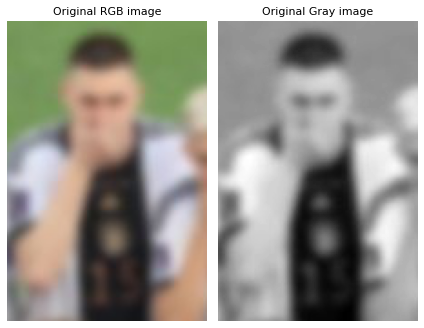

In [3]:
# Getting the image
gray_image, image_RGB = get_image('soccerteam.jpg')

# Getting the player with jersey 15 (for better understanding)
gray_image = gray_image[40:205, 500:610]  
image_RGB = image_RGB[40:205, 500:610]   

# Displaying the images
display_RGB_n_gray_images(image_RGB, gray_image, size=(6, 9))

<center>Figure- 1: Displaying the imported images in RGB and gray </center>

In [4]:
def sharpen(image, sharpmask):
    """Performs an image sharpening using Laplace filter/unsharpen mask (USM)/Median filter/ High-pass-filter
    1 = Laplace
    2 = USM with sigma 3
    3 = USM with sigma 5
    4 = USM with sigma 7    
    10 = USM with sigma 10      
    5 = High pass filter with sigma 3
    6 = High pass filter with sigma 5
    7 = High pass filter with sigma 7 
    11 = High pass filter with sigma 10
    8 = Median filter with square 3 
    9 = Median filter with square 2 
    Returns: sharpened image"""
    
    amount = 3 # weight of sharpening (used in USM)
    sharpened = 0
    if sharpmask == 1:
        filtered = laplace(image) 
        sharpened = image - amount*filtered
    elif sharpmask == 2:  #USM with sigma 3
        gaussasian_blur = gaussian(image, sigma=3) 
        sharpened = image + amount*(image - gaussasian_blur)
    elif sharpmask == 3:  #USM with sigma 5
        gaussasian_blur = gaussian(image, sigma=5) 
        sharpened = image + amount*(image - gaussasian_blur)
    elif sharpmask == 4:  #USM with sigma 7
        gaussasian_blur = gaussian(image, sigma=7) 
        sharpened = image + amount*(image - gaussasian_blur)
    elif sharpmask == 10:  #USM with sigma 10
        gaussasian_blur = gaussian(image, sigma=10) 
        sharpened = image + amount*(image - gaussasian_blur)
    elif sharpmask == 5:  # High pass with sigma 3
        gaussasian_blur = gaussian(image, sigma=3) 
        sharpened = image - gaussasian_blur  
    elif sharpmask == 6:  # High pass with sigma 5
        gaussasian_blur = gaussian(image, sigma=5) 
        sharpened = image - gaussasian_blur  
    elif sharpmask == 7:  # High pass with sigma 7
        gaussasian_blur = gaussian(image, sigma=7) 
        sharpened = image - gaussasian_blur 
    elif sharpmask == 11:  # High pass with sigma 10
        gaussasian_blur = gaussian(image, sigma=10) 
        sharpened = image - gaussasian_blur         
    elif sharpmask == 8: # Median with square 3
        sharpened = median(image, np.ones((3, 3))) 
    elif sharpmask == 9: # Median with square 2
        sharpened = median(image, np.ones((2, 2))) 
    else:
        print("wrong mask")
    return sharpened

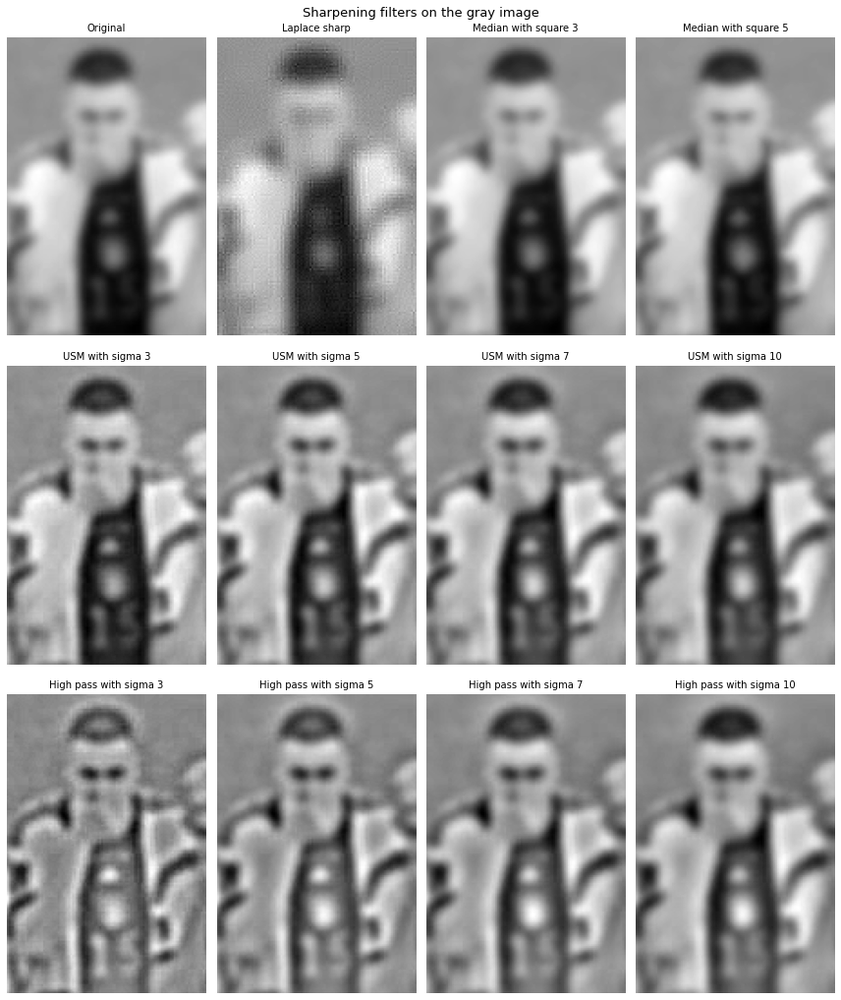

In [5]:
# Calling all the sharpening filters
laplace_sharp = sharpen(gray_image[:,:], 1)

median1 = sharpen(gray_image[:,:], 8) #Median with square 3
median2 = sharpen(gray_image[:,:], 9) #Median with square 2

usm_sharp = sharpen(gray_image[:,:], 2) #USM with sigma 3
usm_sharp2 = sharpen(gray_image[:,:], 3) #USM with sigma 5
usm_sharp3 = sharpen(gray_image[:,:], 4) #USM with sigma 7
usm_sharp4 = sharpen(gray_image[:,:], 10) #USM with sigma 10

high_pass_sharp = sharpen(gray_image[:,:], 5) #High pass with sigma 3
high_pass_sharp2 = sharpen(gray_image[:,:], 6) #High pass with sigma 5
high_pass_sharp3 = sharpen(gray_image[:,:], 7) #High pass with sigma 7
high_pass_sharp4 = sharpen(gray_image[:,:], 11) #High pass with sigma 10


# Displaying the sharpening results
fig, ax = plt.subplots(nrows = 3, ncols = 4, figsize = (12, 14.5))
fig.suptitle("Sharpening filters on the gray image", fontsize = 12)  

ax[0, 0].imshow(gray_image, cmap ='gray')
ax[0, 0].set_title('Original', fontsize = 10)

ax[0, 1].imshow(laplace_sharp, cmap ='gray')
ax[0, 1].set_title(r'Laplace sharp', fontsize = 10)

ax[0, 2].imshow(median1, cmap ='gray')
ax[0, 2].set_title('Median with square 3', fontsize = 10)

ax[0, 3].imshow(median2, cmap ='gray')
ax[0, 3].set_title('Median with square 5', fontsize = 10)

ax[1, 0].imshow(usm_sharp, cmap ='gray')
ax[1, 0].set_title(r'USM with sigma 3', fontsize = 10)

ax[1, 1].imshow(usm_sharp2, cmap ='gray')
ax[1, 1].set_title(r'USM with sigma 5', fontsize = 10)

ax[1, 2].imshow(usm_sharp3, cmap ='gray')
ax[1, 2].set_title(r'USM with sigma 7', fontsize = 10)    

ax[1, 3].imshow(usm_sharp4, cmap ='gray')
ax[1, 3].set_title(r'USM with sigma 10', fontsize = 10)   

ax[2,0].imshow(high_pass_sharp, cmap ='gray')
ax[2,0].set_title(r'High pass with sigma 3', fontsize = 10)

ax[2,1].imshow(high_pass_sharp2, cmap ='gray')
ax[2,1].set_title(r'High pass with sigma 5', fontsize = 10)

ax[2,2].imshow(high_pass_sharp3, cmap ='gray')
ax[2,2].set_title(r'High pass with sigma 7', fontsize = 10)

ax[2,3].imshow(high_pass_sharp4, cmap ='gray')
ax[2,3].set_title(r'High pass with sigma 10', fontsize = 10)
for row in ax:
    for col in row:
        col.axis('off')

fig.tight_layout()
plt.show()

<center>Figure- 2: Sharpening filters on the gray image </center>

### Comment on the effect of filters/masks on the given image: 
From the Figure-2, we can understand the following effects of the filters on the given image.
- **Laplace filter**: It had the worst sharpening effect compared to the others. It made the image even noiser by enhancing unwanted edges present in the image.
    
- **Median filter**: Since the pixelation has reduced, the image looks slightly sharpened. But due to smoothing the jersey number had almost disappeared.
    
- **Unsharpened Mask (USM)**: In terms of sharpening and retaining the image quality and contrast, USM seemed to be the best. The jersy number, the hands and the eyes are much more sharpened and visible. 
    
- **High pass filter**: It has more defined & highlighted edge detection. But the increased contrast can lose smaller details. For example, the details of the player's shirt.


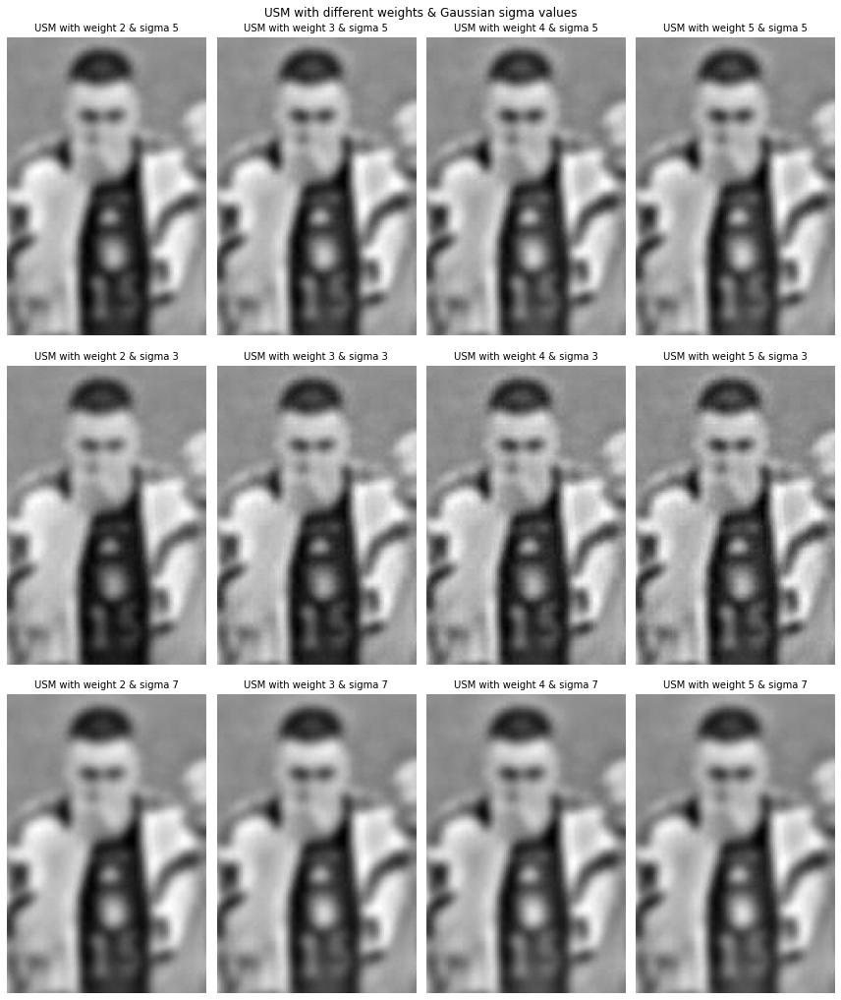

In [6]:
# Analyzing USM with weight 2, 3, 4, 5
image = gray_image.copy()

gaussasian_blur = gaussian(image, sigma=3) 
usm_sharp_w222 = image + 2*(image - gaussasian_blur) 
usm_sharp_w333 = image + 3*(image - gaussasian_blur) 
usm_sharp_w444 = image + 4*(image - gaussasian_blur) 
usm_sharp_w555 = image + 5*(image - gaussasian_blur) 

gaussasian_blur = gaussian(image, sigma=5) 
usm_sharp_w2 = image + 2*(image - gaussasian_blur) 
usm_sharp_w3 = image + 3*(image - gaussasian_blur) 
usm_sharp_w4 = image + 4*(image - gaussasian_blur) 
usm_sharp_w5 = image + 5*(image - gaussasian_blur) 

gaussasian_blur = gaussian(image, sigma=7) 
usm_sharp_w22 = image + 2*(image - gaussasian_blur) 
usm_sharp_w33 = image + 3*(image - gaussasian_blur) 
usm_sharp_w44 = image + 4*(image - gaussasian_blur) 
usm_sharp_w55 = image + 5*(image - gaussasian_blur) 

# Displaying the USM results with different weights and sigma
fig, ax = plt.subplots(nrows = 3, ncols = 4, figsize = (12, 14.5))
fig.suptitle("USM with different weights & Gaussian sigma values", fontsize = 12)  

ax[1, 0].imshow(usm_sharp_w222, cmap ='gray')
ax[1, 0].set_title(r'USM with weight 2 & sigma 3', fontsize = 10)

ax[1, 1].imshow(usm_sharp_w333, cmap ='gray')
ax[1, 1].set_title(r'USM with weight 3 & sigma 3', fontsize = 10)

ax[1, 2].imshow(usm_sharp_w444, cmap ='gray')
ax[1, 2].set_title(r'USM with weight 4 & sigma 3', fontsize = 10)    

ax[1, 3].imshow(usm_sharp_w555, cmap ='gray')
ax[1, 3].set_title(r'USM with weight 5 & sigma 3', fontsize = 10)  

ax[0, 0].imshow(usm_sharp_w2, cmap ='gray')
ax[0, 0].set_title('USM with weight 2 & sigma 5', fontsize = 10)

ax[0, 1].imshow(usm_sharp_w3, cmap ='gray')
ax[0, 1].set_title(r'USM with weight 3 & sigma 5', fontsize = 10)

ax[0, 2].imshow(usm_sharp_w4, cmap ='gray')
ax[0, 2].set_title('USM with weight 4 & sigma 5', fontsize = 10)

ax[0, 3].imshow(usm_sharp_w4, cmap ='gray')
ax[0, 3].set_title('USM with weight 5 & sigma 5', fontsize = 10)

ax[2, 0].imshow(usm_sharp_w22, cmap ='gray')
ax[2, 0].set_title(r'USM with weight 2 & sigma 7', fontsize = 10)

ax[2, 1].imshow(usm_sharp_w33, cmap ='gray')
ax[2, 1].set_title(r'USM with weight 3 & sigma 7', fontsize = 10)

ax[2, 2].imshow(usm_sharp_w44, cmap ='gray')
ax[2, 2].set_title(r'USM with weight 4 & sigma 7', fontsize = 10)    

ax[2, 3].imshow(usm_sharp_w44, cmap ='gray')
ax[2, 3].set_title(r'USM with weight 5 & sigma 7', fontsize = 10)   

for row in ax:
    for col in row:
        col.axis('off')

fig.tight_layout()
plt.show()

<center>Figure- 3: USM with different weights & Gaussian sigma values </center>

### Comment on the analysis of USM with different weights:
From the Figure-3, I have identified the following patterns.
- Higher the weight, lower the contrast the images have.
- Higher sigma increases the contrast but makes the small details blurry.

**Depending on the context and task, we can choose any appropritate weight and sigma for sharpening the image.**

<a id='E1b'></a>
# <font color='blue '>Exercise 1 (b): Canny filter on sharpened & unsharpened image  <font>

### Canny Filter:
Canny filter is one of the most popular edge detecting filters which works incorporating multiple stages. For applying this filter, the image has to be in the gray scale format. It has three parameters for computing the perfect edges. It uses:

- the Gausian filter with the sigma value controlling the intensity of the smoothing/blurring for getting rid of the noises present in the image. 
- the Sobel filter for computing the gradient of the image which involves acquiring the edge intensity and direction.
- the Hysterisis thresholding(min and max) for determining strong and weak edges present in the image. Finally eliminating weak edges without having any link to the strong edges. 
    
**Example**: It is used for detecting the roads. Similarly in Exercise 3(f), I have used it for outlining the vegetation present in the image.
   
### Identification of images from the given sample:
From the sample image, we can see that-
- Left image: Canny filter with sigma = 3 has been applied on the *original* image
- Right image: Canny filter with sigma = 3 has been applied on the *sharpened* image

### Displaying the usage of Canny filter with different sigma values:
For displaying the results of canny filter, I have used the original image and the sharpened image. For the sharpened image, I have chosen the USM sharpened image where sigma value 10 has been used for sharpening it.

In [7]:
# Importing the image in gray- scale
gray_image = io.imread('soccerteam.jpg', as_gray = True) 

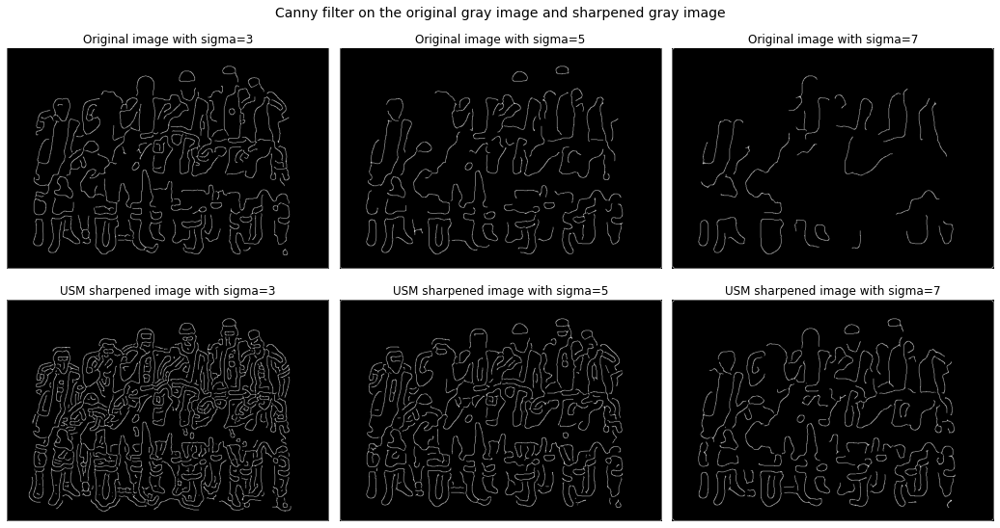

In [8]:
# Canny filter on original gray image
canny_filtered1 = feature.canny(gray_image, sigma = 3)  
canny_filtered2 = feature.canny(gray_image, sigma = 5)  
canny_filtered3 = feature.canny(gray_image, sigma = 7)  

# usm_sharpened image with sigma value 10
usm_sharp2 = sharpen(gray_image[:,:], 3)

# Canny filter on sharpened gray image 
canny_filtered_sharped1 = feature.canny(usm_sharp2, sigma = 3)  
canny_filtered_sharped2 = feature.canny(usm_sharp2, sigma = 5)  
canny_filtered_sharped3 = feature.canny(usm_sharp2, sigma = 7)  

# Displaying the canny filtered images
fig, ax = plt.subplots(nrows = 2, ncols = 3, figsize = (14.5, 8))
fig.suptitle("Canny filter on the original gray image and sharpened gray image", fontsize = 14)  

ax[0, 0].imshow(canny_filtered1, cmap ='gray')
ax[0, 0].set_title('Original image with sigma=3', fontsize = 12)

ax[0, 1].imshow(canny_filtered2, cmap ='gray')
ax[0, 1].set_title('Original image with sigma=5', fontsize = 12)

ax[0, 2].imshow(canny_filtered3, cmap ='gray')
ax[0, 2].set_title('Original image with sigma=7', fontsize = 12)

ax[1, 0].imshow(canny_filtered_sharped1, cmap ='gray')
ax[1, 0].set_title('USM sharpened image with sigma=3', fontsize = 12)

ax[1, 1].imshow(canny_filtered_sharped2, cmap ='gray')
ax[1, 1].set_title('USM sharpened image with sigma=5', fontsize = 12)

ax[1, 2].imshow(canny_filtered_sharped3, cmap ='gray')
ax[1, 2].set_title('USM sharpened image with sigma=7', fontsize = 12)    

for row in ax:
    for col in row:
        col.axis('off')

fig.tight_layout()
plt.show()

<center>Figure- 4: Canny filter on the original gray image and sharpened gray image </center>

### Comment on the Canny filtered images:
From the Figure-4, I have identified the following patterns:
- Since the sharpened image had more defined edges than the unsharpened original image, the canny filtered sharpened images look much more noiser.
- The sigma value we set in the canny filter is used by the Gaussian filter part of it's multiple stages which mainly works for smoothing/blurring/removing the noises present in the image. Hence higher the sigma value, the less the edges are present in the image. This is applicable to both the sharpened and the unsharpened image.

<a id='E2'></a>
# <font color='blue '>Exercise 2<font>


At first, I imported the necessary modules and images for this task. After importing the image, I cropped the image for getting rid of the background without any objects present in it.
    
### Importing the necessary modules and the image for this task


In [9]:
# Importing the necessary modules
import matplotlib.pyplot as plt
import numpy as np
from skimage import io

# For morphology
from skimage.morphology import erosion, dilation, opening, square, disk, remove_small_holes

# For conversion of images
from skimage.color import rgb2lab, gray2rgb 

# For binarising
from skimage.filters import try_all_threshold, threshold_otsu, threshold_li

# For watershed
from scipy import ndimage as ndi#for distance
from skimage.feature import peak_local_max 
from skimage.segmentation import watershed 
from skimage import measure # measure objects

# For ignoring futurewarnings about indices
import warnings
warnings.simplefilter(action ='ignore', category=FutureWarning)

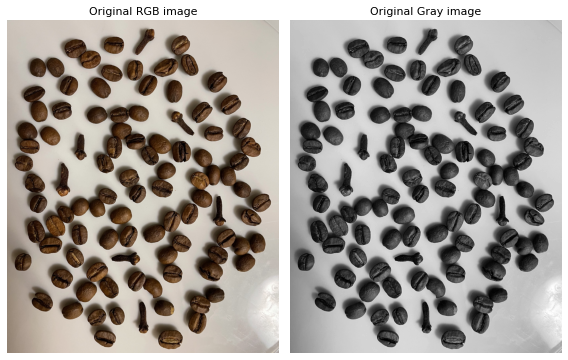

In [10]:
# Getting the image [Reusing the function from Exercise 2(a)]
image_gray, image_RGB = get_image("coffeebeans.jpg")

# Cropping for getting the image without any white background 
image_gray = image_gray[330:3670, 130:2860]    
image_RGB = image_RGB[330:3670, 130:2860]   

# Displaying the images [Reusing the function from Exercise 2(a)]
display_RGB_n_gray_images(image_RGB, image_gray, size=(8,6))

<center>Figure- 5: Displaying the image in RGB and gray-scale </center>

<a id='E2a'></a>
## <font color='blue '>Exercise 2 (a): Shadow removing techniques<font>

From the given image, we can see both the RGB and the gray version of the images have shadows in them. So, for removing the shadows a modified masking process has been followed. The code has been presented in Exercise 2(b) and the steps have been described below:
- **Step 1: Choosing the color channel:** Finding the appropritate color channel which has the minimum amount of shadow present in it. For this we have checked the RGB and CIE Lab colour space. 
   - RGB has 3 color channels: red, green and blue.
   - CIE Lab has 3 color channels: L, A and B.
   
From this, step I have identified **image-A** from the CIE Lab has the most appropriate image with minimum shadows present.
- **Step 2: Creating a mask:** Using the chosen "image-A" a mask has been created by the following steps.
     - **1. Binarising/thresholding**: Analyzed all the binarising methods on the chosen "image-A". Found the "Li" is the most suitable among the binarising/thresholding methods because it eliminates most of the shadow parts and creates minimum holes in the objects. 
     - **2. Filling holes**: 
         - With the inverted binary image, I used remove_small_holes() with area_threshold = 500 from the morphology which filled up most of the holes present in the objects.
         - Then for further minimizing the holes, I tried to use closing() with disk(3) and disk(5) which did not work well. So, instead of that I have used dilation() with disk(3) and erosion() with disk(1) for 4 times, which gave the same result as closing(), but with better filling holes result.
         - Then finally, remove_small_holes()  with area_threshold = 500 were applied. Then inverted the image to get the final mask of the "image-A".
- **Step 3: Generating the image without shadows (Masked image):** 
     - For masking, I have created a custom function called masking_image() which takes the original RGB image and the mask, then returns the masked image.
     - For matching the dimensions of the RGB image, I converted the mask from gray to the RGB format using the gray2rgb() which made it easier to do the "OR operation" between the pixel of both the images.

Thus, we get our masked image which is without any shadows. **<font color='blue '>[The code and the result images have been presented in the Exercise 2 (b)]<font>**


<a id='E2b'></a>
## <font color='blue '>Exercise 2 (b): Masking of objects with and without shadow<font>

### Masking without shadow

**Step 1: Displaying and choosing the color channel:** After analyzing the color channels from the RGB and CIE Lab colour space, I have found the "image-A" is the most suitable one with the minimum amount of shadow.

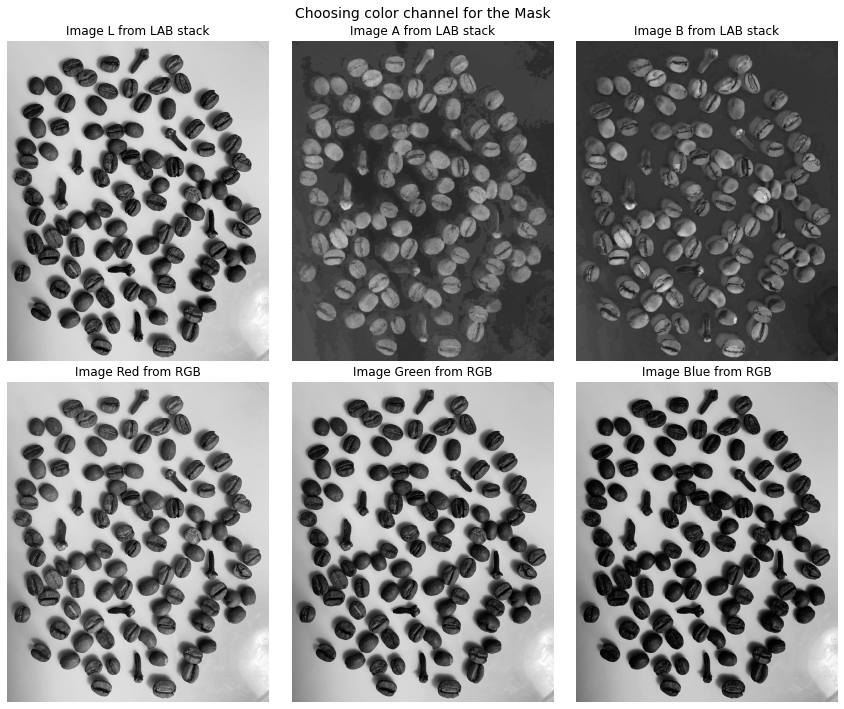

In [11]:
# Splitting the RGB color channels
img_red = image_RGB [:,:,0] # pull out the red channel
img_green = image_RGB [:,:,1] # pull out the green channel
img_blue = image_RGB [:,:,2] # pull out the blue channel

# Splitting the CIE LAB Stack
img_lab = rgb2lab(image_RGB)# Converting from RGB to LAB stack
img_l = img_lab[:,:,0] # pull out L channel
img_a = img_lab[:,:,1] # pull out A channel
img_b = img_lab[:,:,2] # pull out B channel

# Displaying differnt color channels of the original RGB image
fig, ax = plt.subplots(nrows = 2, ncols = 3, figsize = (12, 10))
fig.suptitle("Choosing color channel for the Mask", fontsize = 14)
ax[0,0].imshow(img_l, cmap='gray')
ax[0,0].set_title('Image L from LAB stack', fontsize = 12)

ax[0,1].imshow(img_a, cmap='gray')
ax[0,1].set_title('Image A from LAB stack', fontsize = 12)

ax[0,2].imshow(img_b, cmap='gray')
ax[0,2].set_title('Image B from LAB stack', fontsize = 12)

ax[1,0].imshow(img_red, cmap='gray')
ax[1,0].set_title('Image Red from RGB', fontsize = 12)

ax[1,1].imshow(img_green, cmap='gray')
ax[1,1].set_title('Image Green from RGB', fontsize = 12)

ax[1,2].imshow(img_blue, cmap='gray')
ax[1,2].set_title('Image Blue from RGB', fontsize = 12)

for row in ax:
    for col in row:
        col.axis('off')

fig.tight_layout()
plt.show()

<center>Figure- 6: Choosing color channel for the Mask </center>

**Step 2: Mask creation:** 
- After analysing all the thresholding methods, chosen Li for binarising the image. 
- After binarisation, on the inverted binary image performed fill holes using remove_small_holes(), dilation() and erosion().
- Then inverted the image for obtainng the final mask.


In [12]:
# Creating mask without shadows

# Binarising the image using the Li filter
thresh = threshold_li(img_a)
binary_li = img_a > thresh

# Filling the holes of the objects in the binary image

# Step1: using remove_small_holes
inverted_binary_li = np.invert(binary_li)
holes_filled_without_shadow = remove_small_holes(inverted_binary_li, area_threshold = 500)

# Step2: using dilation & erosion
mask_without_shadow = np.invert(holes_filled_without_shadow.copy()) 
for _ in range(4):
    mask_without_shadow = dilation(mask_without_shadow, disk(3))
for _ in range(4):
    mask_without_shadow = erosion(mask_without_shadow, disk(1))

mask_without_shadow = remove_small_holes(mask_without_shadow, area_threshold = 800)    
mask_without_shadow = np.invert(mask_without_shadow)*1.0 # for making it numerical

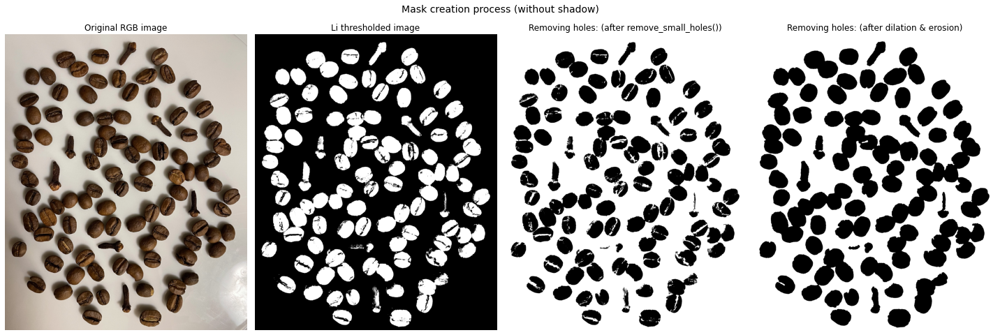

In [13]:
# Displaying the mask creation process (without shadows)
fig, ax = plt.subplots(nrows = 1, ncols = 4, figsize = (20, 7))
fig.suptitle("Mask creation process (without shadow)", fontsize = 14)

ax[0].imshow(image_RGB)
ax[0].set_title('Original RGB image', fontsize = 12)

ax[1].imshow(binary_li, cmap='gray')
ax[1].set_title("Li thresholded image", fontsize = 12)

ax[2].imshow(holes_filled_without_shadow, cmap='gray')
ax[2].set_title("Removing holes: (after remove_small_holes())", fontsize = 12)

ax[3].imshow(mask_without_shadow, cmap='gray')
ax[3].set_title("Removing holes: (after dilation & erosion)", fontsize = 12)

for row in ax:
    row.axis('off')

fig.tight_layout()
plt.show()

<center>Figure- 7: Mask creation process (without shadow) </center>

**Step 3: Generating the masked image without shadows**: For masking of the image a function named masking_image() has been used which works in the following manner.
  - Converts the  mask from the gray-format to the RGB-format for helping with the merging of images
  - In the mask, the background is white and the objects are black. So, each pixel of mask has been checked. If the value is 255(white), it has been copied to the RGB image. Thus, we are getting our masked image without any shadows.

In [14]:
# The function masking_image() and display_mask_results() works for both the masks(with shadow & without shadow)
# Function for creating the mask image which takes 2 images as parameters: original RGB image & the mask
def masking_image(image_RGB, mask):
    """ Parameters:
        image_RGB: the original RGB image
        mask: image where objects are black and backgrouns is white
    Return:
        masked_image: Result image where the background of the original RGB image has been replaced with white"""
    
    RGB_mask = gray2rgb(mask)# Converting the mask from gray to RGB format
    masked_image = image_RGB.copy() # Creating a copy of the RGB image
    
    shape = np.shape(RGB_mask)
    for i in range(shape[0]):
        for j in range(shape[1]):
            a, b, c = RGB_mask[i, j]
            if (a == 1.0) and (b== 1.0) and (c==1.0): # Checking if the pixel from the mask is white
                masked_image[i, j] = [255, 255, 255] # Setting the pixel of the original image to white
    return masked_image

# Displaying the final masked results
def display_mask_results(image_RGB, mask, masked_answer, masking_type = ""):
    fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (14, 8))

    ax[0].imshow(image_RGB)
    ax[0].set_title('Original RGB image', fontsize = 14)

    ax[1].imshow(mask, cmap='gray')
    ax[1].set_title("Mask "+ masking_type, fontsize = 14)

    ax[2].imshow(masked_answer, cmap='gray')
    ax[2].set_title("Masked result " + masking_type , fontsize = 14)

    for row in ax:
        row.axis('off')

    fig.tight_layout()
    plt.show()

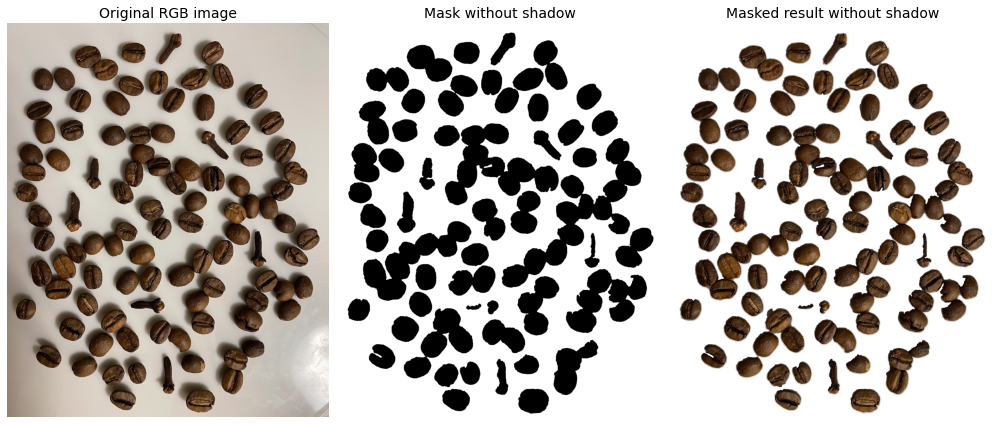

In [15]:
# Generating the masked image without shadows
without_shadow_masked_result = masking_image(image_RGB, mask_without_shadow)

# Displaying the masked results without shadows
display_mask_results(image_RGB, mask_without_shadow, without_shadow_masked_result, masking_type = "without shadow")

<center>Figure- 8: Masking process (without shadow) </center>

### Masking with shadow

**Step 1: Mask creation:** 
- After analysing all the thresholding methods, chosen Otsu for binarising the image. 
- After binarisation, on the inverted binary image performed fill holes using remove_small_holes() with area_threshold = 8000.
- Then inverted the image for obtainng the final mask.

In [16]:
# Binarising the image using the Otsu filter
thresh_with_shadow = threshold_otsu(image_gray)
binary_otsu_with_shadow = image_gray > thresh_with_shadow

# Filling the holes of the objects in the binary image
inverted_binary_otsu = np.invert(binary_otsu_with_shadow)
holes_filled_with_shadow = remove_small_holes(inverted_binary_otsu, area_threshold = 8000)

# Creating the mask with shadows
mask_with_shadow = np.invert(holes_filled_with_shadow)*1.0

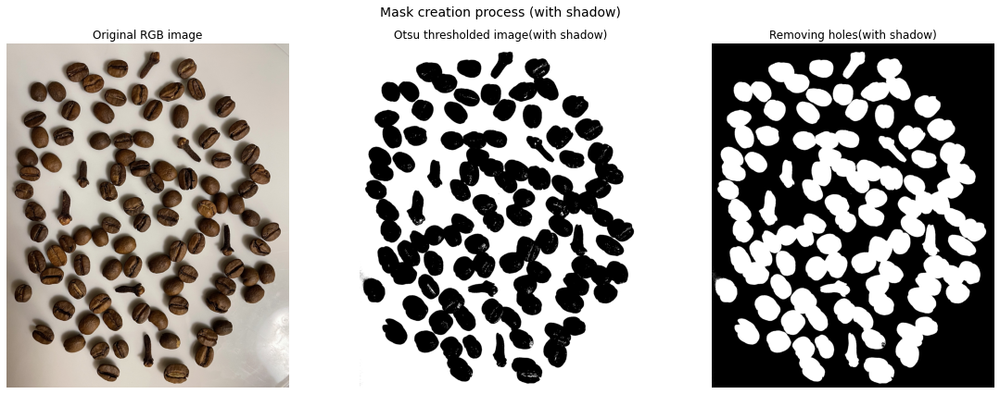

In [17]:
# Displaying the images
fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (16, 6))
fig.suptitle("Mask creation process (with shadow)", fontsize = 14)

ax[0].imshow(image_RGB)
ax[0].set_title('Original RGB image', fontsize = 12)

ax[1].imshow(binary_otsu_with_shadow, cmap='gray')
ax[1].set_title("Otsu thresholded image(with shadow)", fontsize = 12)

ax[2].imshow(holes_filled_with_shadow, cmap='gray')
ax[2].set_title("Removing holes(with shadow)", fontsize = 12)


for row in ax:
    row.axis('off')

fig.tight_layout()
plt.show()

<center>Figure- 9: Mask creation process (with shadow)</center>

**Step 2: Generating the masked image with shadows:** Using the same function masking_image() as before the masking is performed. Here, the original RGB image and the mask_with_shadow has been used.

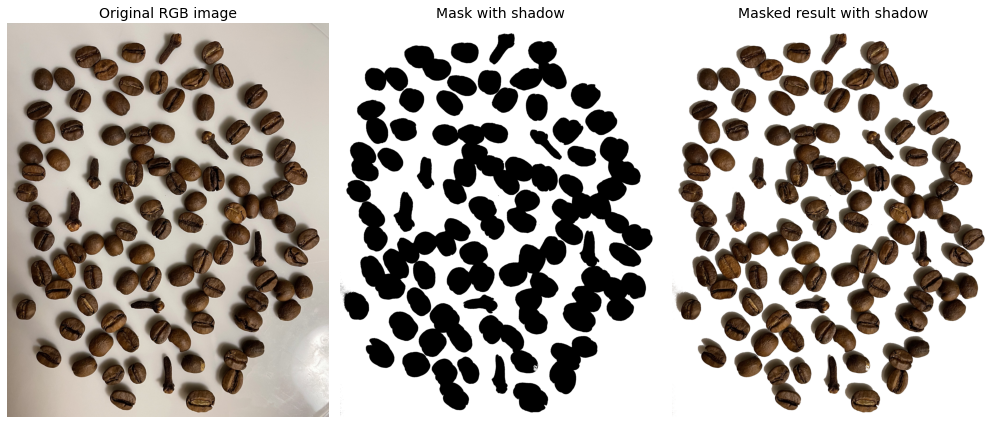

In [18]:
# Generating the masked image with shadows
shadow_masked_result = masking_image(image_RGB, mask_with_shadow)

#Displaying the masked results with shadow
display_mask_results(image_RGB, mask_with_shadow,shadow_masked_result, masking_type = "with shadow")

<center>Figure- 10: Masking process (with shadow)</center>

### Comparison of the masked image with and without shadow

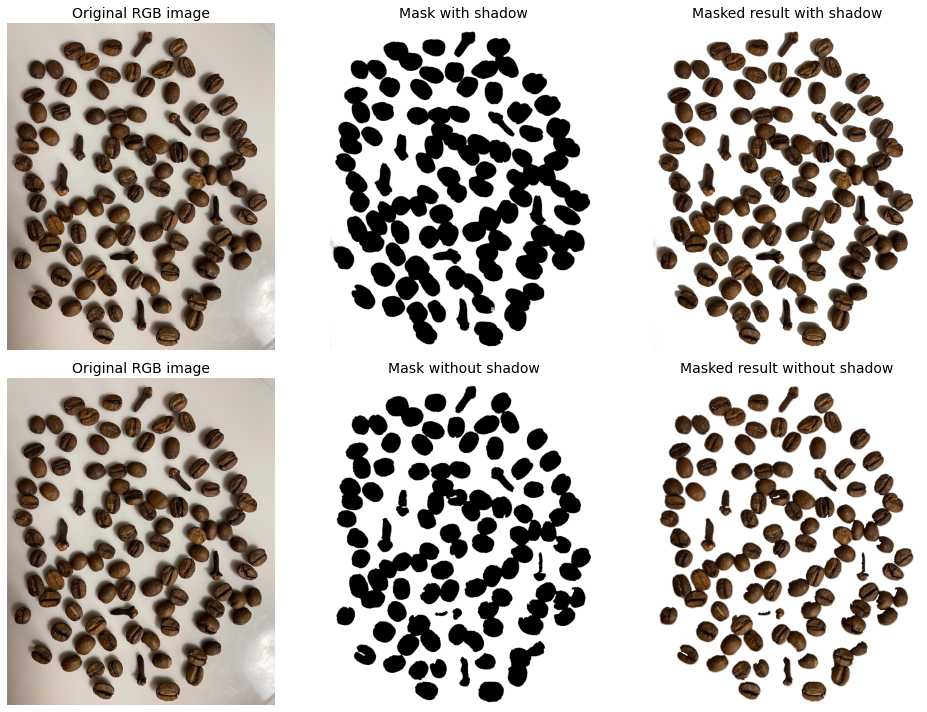

In [19]:
fig, ax = plt.subplots(nrows = 2, ncols = 3, figsize = (14, 10))

ax[0, 0].imshow(image_RGB)
ax[0, 0].set_title('Original RGB image', fontsize = 14)

ax[0, 1].imshow(mask_with_shadow, cmap='gray')
ax[0, 1].set_title("Mask with shadow", fontsize = 14)

ax[0, 2].imshow(shadow_masked_result, cmap='gray')
ax[0, 2].set_title("Masked result with shadow" , fontsize = 14)

ax[1, 0].imshow(image_RGB)
ax[1, 0].set_title('Original RGB image', fontsize = 14)

ax[1, 1].imshow(mask_without_shadow, cmap='gray')
ax[1, 1].set_title("Mask without shadow", fontsize = 14)

ax[1, 2].imshow(without_shadow_masked_result, cmap='gray')
ax[1, 2].set_title("Masked result without shadow" , fontsize = 14)

for row in ax:
    for col in row:
        col.axis('off')

fig.tight_layout()
plt.show()

<center>Figure- 11: Comparison of the masked image with and without shadow</center>

#### Comments on the comparison
From the Figure-11, I have identified the followings.
- In both of the images, the backgrounds have been successfully removed.
- The masked image with the shadows has all the objects intact, even though the shadows are present.
- The masked image without the shadows has a few parts of some of the objects missing.

Hence, depending on our need, we can choose any of the procedures for masking.

<a id='E2c'></a>
## <font color='blue '>Exercise 2 (c): Counting the coffee beans<font>

For counting the coffee beans, I have used the below mentioned 5 steps:
- **Step 1: Getting the mask**: For counting the beans, I am using the mask that I had created for Exercise 2 (b). I will be using the mask with the shadows.
- **Step 2: Distance map**: Generated a "Distance map" for understanding the distance between the objects.
- **Step 3: Watershed for object detection**: Using the "distance map", the "watershed" process has been applied on the image for separating the merged objects. Here, after experimenting with different min_distances, I have chosen 90 as the optimal value. It ensures that local peaks are not too close. Thus, helps in the separation of the very closely placed beans.
- **Step 4: Measure the objects**: For getting the properties of the detected objects, I have used the measure module from the skimage.
- **Step 5: Detecting the beans**: For identifying the beans, 3 properties has been used.
    - Eccentricity:  It has value in the interval (0, 1). When it is 0, the ellipse becomes a circle. Since the beans are more rounder than the cloves, I have set it to less than 0.901.
    - Area: Set it to greater than 25000.
    - Major_axis_length: Set it to greater than 100.
- **Step 6: Marking the beans**: For better visualisation, I have marked the beans with numbers in the image using the text from the matplotlib.
    
**Using the above mentioned process, I have idnetified, there are 93 beans present in the image**. The code has been presented below.


In [20]:
# Step2: Generating the Distance map 
distance = ndi.distance_transform_edt(holes_filled_with_shadow) 

# Step3: Using the watershed for separating the merged objects
local_maxi = peak_local_max(distance, min_distance = 90, indices = False, footprint = np.ones((26,26)), 
                            labels = holes_filled_with_shadow.astype(int))
markers = ndi.label(local_maxi)[0]
labels_objects_detected = watershed(-distance, markers, mask = holes_filled_with_shadow, watershed_line = True)

# Step4: Measuring the properties of the objects detected
labels2 = measure.label(labels_objects_detected)
properties = measure.regionprops(labels2)

# Step5: Detecting the beans
truncated_beans = [prop for prop in properties if (prop.eccentricity<=0.901 and prop.area>=25000 
                                                   and prop.major_axis_length >= 100)]

print("Number of beans:", len(truncated_beans))
image_beans = holes_filled_with_shadow[:,:]*1

for obj in truncated_beans:
    for coord in obj.coords:
        image_beans[coord[0], coord[1]] = 2

Number of beans: 93


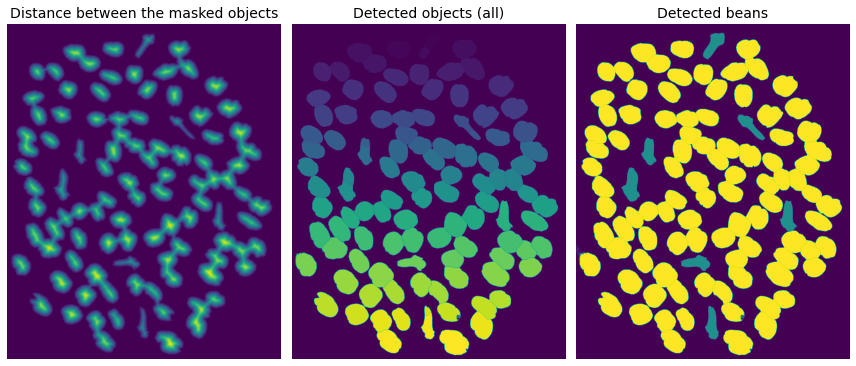

In [21]:
# Displaying the watershed results and beans detected
fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (12, 6))
ax[0].imshow(distance)
ax[0].set_title('Distance between the masked objects', fontsize = 14)

ax[1].imshow(labels_objects_detected)
ax[1].set_title("Detected objects (all)", fontsize = 14)

ax[2].imshow(image_beans)
ax[2].set_title("Detected beans", fontsize = 14)

for row in ax:
    row.axis('off')
fig.tight_layout()
plt.show()

<center>Figure- 12: Bean counting process</center>

#### Step 6: Marking the detected beans with numbers
Detected beans have been marked with white text using the information in the centroids.

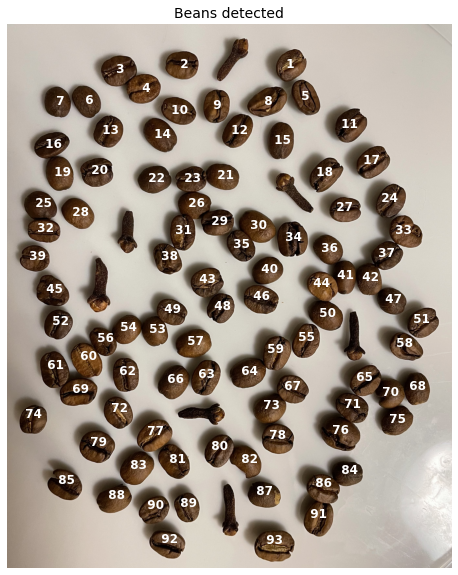

In [22]:
# Finding the center points for putting the number/text on the beans
centers =[]
for prop in truncated_beans:
    y, x = prop.centroid # unpacking the centroids for minimizing the decimal points
    centers.append((round(x, 2), round(y, 2)))
    
# Adding numbers on the beans
plt.subplots(1,1,figsize=(14, 10))
number = 1
for center in centers:
    plt.gca().text(x = center[0], y = center[1], s= "  "+str(number), horizontalalignment='center', fontsize = 12,
                   verticalalignment='center', fontweight='extra bold', color='white')
    number+=1
    
# Displaying the detected beans
plt.imshow(image_RGB , cmap='gray')
plt.title(label = "Beans detected", fontsize=14)
plt.axis('off')
plt.show()

<center>Figure- 13: Marked & counted beans</center>

<a id='E2d'></a>
## <font color='blue '>Exercise 2 (d): List with the center x, y positions of all the coffee beans<font>

We know from the geometry, the center x, y positions of an object is called an "centroid" or "geometric center". In the properties of the "measure" module of the skimage, there is an attribute called "centroid". This attribute has the center of the detected object stored as an coordinate tuple (Y, X) or (row, col). Utilizing this attribute, I have created a list of the centroid locations for all the detected beans where the centers are represented in the tuple format (X, Y). While storing the positions/centers, I have chosen to take only 2 decimal points for better represendation of the results.

In [23]:
# Listing the center of the detected beans
bean_locations =[]
for prop in truncated_beans:
    y, x = prop.centroid # unpacking the centroids for minimizing the decimal points
    bean_locations.append((round(x, 2), round(y, 2)))
print("Number of detected beans:", len(bean_locations))    
print("Centroid of the detected beans:", bean_locations)

Number of detected beans: 93
Centroid of the detected beans: [(1715.44, 247.33), (1060.48, 248.95), (669.31, 280.11), (827.22, 394.99), (1806.83, 444.7), (480.45, 470.5), (302.03, 476.29), (1582.3, 475.62), (1268.59, 500.07), (1035.47, 527.96), (2080.37, 614.58), (1401.08, 651.19), (609.0, 652.76), (930.05, 676.04), (1668.27, 712.01), (261.31, 735.89), (2214.03, 837.89), (1925.48, 912.24), (315.49, 913.74), (540.28, 900.67), (1313.16, 929.86), (893.64, 947.83), (1112.74, 945.09), (2322.82, 1071.86), (194.89, 1101.99), (1136.11, 1102.7), (2049.74, 1128.62), (428.3, 1156.53), (1279.3, 1211.22), (1519.61, 1236.37), (1058.47, 1268.13), (210.14, 1254.8), (2412.61, 1266.84), (1731.88, 1311.77), (1417.41, 1353.27), (1956.39, 1374.76), (2304.41, 1409.0), (970.16, 1429.56), (158.43, 1425.61), (1585.84, 1505.4), (2054.77, 1545.83), (2205.97, 1555.22), (1206.35, 1567.4), (1908.44, 1594.09), (265.04, 1628.69), (1536.34, 1674.66), (2348.11, 1693.6), (1298.22, 1733.51), (992.12, 1753.14), (1942.68, 

<a id='E2e'></a>
## <font color='blue '>Exercise 2 (e): Computing the size of the coffee beans is challenging <font>

**Area detection with the shadows:** Similar to the *Exercise 2(d)*, we can obtain the area or the size of the detected objects from the properties of the "measure" module of the skimage. But the areas of the beans are not 100% accurate. Because when the objects were being detected, their shadows were not taken into the consideration which is now included in the area of the each detected object. So, not a good way of computing the area.
    
**Area detection without the shadows:** Detecting the areas without the shadows is also quite challenging. Because for measuring the objects, we first need to detect the objects. From *Exercise 2(b)*, we can see during the shadow removal process using the mask, a few of beans had newly developed holes and cracks in them which is not suitable for the watershedding to work properly. Hence, it is quite challening to detect the areas.


In [24]:
# Computing the size/area of the detected beans with shadows [Not accurate]
bean_areas =[]
for prop in truncated_beans:
    bean_areas.append(prop.area)
    
print("Bean sizes:", bean_areas)

Bean sizes: [36948, 33149, 36158, 33727, 37150, 28690, 27468, 37993, 33704, 32735, 41129, 34623, 33211, 34199, 34907, 30297, 42708, 41577, 31738, 33820, 29834, 31044, 29307, 40938, 29947, 28856, 32355, 30867, 29429, 35650, 36462, 30426, 41376, 41268, 30208, 28721, 35700, 30906, 29616, 30091, 27160, 29697, 35768, 30892, 34946, 38313, 25413, 29273, 30399, 35048, 40771, 32712, 27188, 28813, 39154, 27492, 36998, 36812, 41576, 38348, 37908, 35388, 39786, 37539, 40297, 36420, 36374, 33958, 40134, 26507, 36374, 35055, 31605, 38309, 34206, 48981, 45258, 39544, 44857, 36664, 33229, 30083, 41395, 29769, 41586, 38814, 32107, 38874, 29794, 35127, 43543, 40279, 55090]


<a id='E3a'></a>
# <font color='blue '>Exercise 3 (a): Loading the image, selecting the wavelengths & the waveband numbers <font>
 

### Choosing  the wavelengths & the waveband numbers   
    
At first, I loaded the image and the header file by python. Since no wavelengths for the RGB was given in the question. For getting the required waveband numbers from the header file, I have to chose the wavelengths for each of the RGB color and the infrared (NIR) color.

We know the wavelength range for the RGB colors are: (Source: https://www.en.silicann.com/blog/post/wavelength-color/)
- Entire Red spectrum approx. 650–750 nm 
- Entire Green spectrum approx. 490–575 nm 
- Entire Blue spectrum approx. 420–490 nm 

I have approximately taken the middle value from each the spectrum and calculated the wave band numbers using those. 
- For Red: chosen 650nm 
- For Green: chosen 540nm 
- For Blue: chosen 450nm 

The infrared radiation (NIR) starts at wavelengths greater than 780nm. So, chosen 800nm for NIR.

The function find_wavebands() takes a list of all the 186 wavelengths and a dictionary of required wavelengths which has waveband name as keys and wavelength as values. It finds the band numbers nearest to the given wavelengths. Then returns a dictionary which has color names as keys and their waveband number as values.

Using my chosen wavelengths, I got the following wavebands:
- Red: waveband 77
- Green: waveband 42
- Blue: waveband 14   
- NIR: waveband 124   

In [25]:
# Importing all the necessary modules
from spectral import *
import numpy as np
import matplotlib.pyplot as plt
import skimage

# For edge detection filters
from skimage import filters #sobel,  prewitt & laplace
from skimage import feature# canny

# For using morphology
from skimage.morphology import dilation, square

In [26]:
def find_wavebands(all_wavelengths, required_wavelengths):
    """ Parameters:
            all_wavelengths: list of all 186 wavelengths available
            required_wavelengths:  a dictionary which has band names as keys and wavelength as values.
        Return:
            required_bands: a dictionary which has band names as keys and band number as values """
    
    required_bands = {}
    for given_wavelength in required_wavelengths.keys():
        band_name = required_wavelengths[given_wavelength]
        wave_band = min(enumerate(all_wavelengths), key=lambda curr_wavelength: abs(curr_wavelength[1]-given_wavelength)) 
        required_bands[band_name] = wave_band[0]    
    return required_bands

In [27]:
# Loading the image
hyperim = np.load("nmbu.npy")

# Loading the header file for getting wavelengths
wavelength = envi.read_envi_header('nmbu.hdr')['wavelength'] # String format
all_wavelengths = [float(i) for i in wavelength] # Converting to float format

# Wavelengths chosen by me
required_wavelengths = {450:"blue", 540:'green', 650:'red', 800:'NIR'}

# Calling the function to get required wavebands
required_bands = find_wavebands(all_wavelengths, required_wavelengths)
print("Wavelength available:", len(wavelength))
print("Wavebands:", required_bands)

Wavelength available: 186
Wavebands: {'blue': 14, 'green': 42, 'red': 77, 'NIR': 124}


In [28]:
# Organising the RGB wavebands in list format
RGB_bands = [required_bands['red'],required_bands['green'],required_bands['blue']]
print("RGB wavebands in list format:", RGB_bands)
NIR_band = required_bands['NIR']
print("NIR waveband", NIR_band)
red_band = required_bands['red']
print("Red band", red_band)

RGB wavebands in list format: [77, 42, 14]
NIR waveband 124
Red band 77


### Diplaying RGB image with only 1 band for each color

With the chosen wavelengths & detected waveband numbers for red, green and blue, an RGB image was computed by adding those band numbers according to their respective color channels.

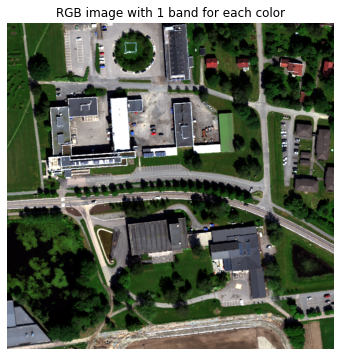

In [29]:
#Displaying the RGB image
imshow(hyperim, bands = RGB_bands, stretch=((0.02,0.98),(0.02,0.98),(0.02,0.98)), figsize=(10,6))
plt.title("RGB image with 1 band for each color")
plt.axis('off')
plt.show()

<center>Figure- 14: RGB image with 1 band for each color</center>

### Displaying RGB image with an average of 10 bands for each color
Since each color might belong to a range of bands, an average of the nearest 10 bands have been taken for each color channel. Then, a new RGB image has been created.

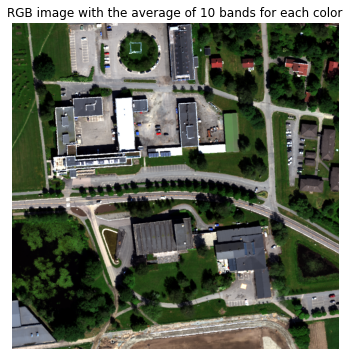

In [30]:
# Creating a copy of the original image
RGB_average_hyperim = hyperim[:, :, :] 

# Creating a average of 10 bands for each color
blue_avg = RGB_average_hyperim [:, :, required_bands['blue']-5:required_bands['blue']+5 +1 ].mean(axis=2)
green_avg = RGB_average_hyperim [:, :, required_bands['green']-5:required_bands['green']+5 +1 ].mean(axis=2)
red_avg = RGB_average_hyperim [:, :, required_bands['red']-5:required_bands['red']+5 +1 ].mean(axis=2)

shape = RGB_average_hyperim.shape
RGB_avg = np.zeros([shape[0], shape[1], 3])
RGB_avg[:, :, 0] = red_avg
RGB_avg[:, :, 1] = green_avg
RGB_avg[:, :, 2] = blue_avg

# Displaying the RGB image
imshow(RGB_avg, stretch=((0.02,0.98),(0.02,0.98),(0.02,0.98)), figsize=(10,6))
plt.title("RGB image with the average of 10 bands for each color")
plt.axis('off')
plt.show()

<center>Figure- 15: RGB image with the average of 10 bands for each color</center>

### Comment on the RGB image with 1 band and the RGB image with the average of 10 bands.
Each of the color belongs to multiple bands, so instead of taking just 1 band, if we take a range of bands(10 bands) belonging to that color, the image quality is slightly improved.

<a id='E3b'></a>
# <font color='blue '>Exercise 3 (b): Generating Spectrum image with the given materials <font>
 

### Spectra image with the selected pixel points:

Six pixel points corresponding to the following materials have been selected from the image and their values have been plotted in the spectra image.
- Grass
- Asphalt
- Black roof
- Red roof
- Solar panels
- Water

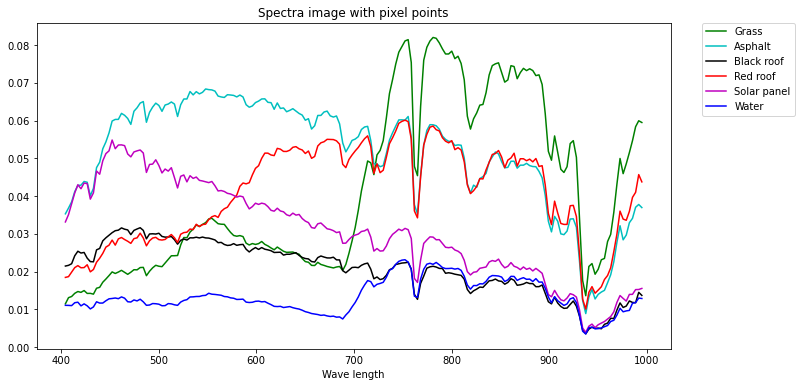

In [31]:
#spectrum of 1 pixel for each material/region
grass = np.array(hyperim[402, 40, :].reshape(-1,1)) # Grass
asphalt = np.array(hyperim[253, 769, :].reshape(-1,1))# Asphalt 
black_roof = np.array(hyperim[719, 735, :].reshape(-1,1)) # Black roof
red_roof = np.array(hyperim[133, 886, :].reshape(-1,1)) # Red roof
solar_panel = np.array(hyperim[405, 429, :].reshape(-1,1)) # Solar panel
water = np.array(hyperim[713, 896, :].reshape(-1,1)) # Water

#Diplaying the spectra
fig, ax_dict = plt.subplot_mosaic([ ['bottom', 'BLANK']], empty_sentinel="BLANK", figsize = (25, 6))

ax_dict['bottom'].plot(all_wavelengths,  grass, color = 'g', label='Grass')
ax_dict['bottom'].plot(all_wavelengths, asphalt, color = 'c', label='Asphalt')
ax_dict['bottom'].plot(all_wavelengths, black_roof, color = 'k',label='Black roof')
ax_dict['bottom'].plot(all_wavelengths,  red_roof, color = 'r', label='Red roof')
ax_dict['bottom'].plot(all_wavelengths, solar_panel, color = 'm', label='Solar panel')
ax_dict['bottom'].plot(all_wavelengths, water , color = 'b',label='Water')

ax_dict['bottom'].legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.title("Spectra image with pixel points")
plt.xlabel("Wave length")
plt.show()

<center>Figure- 16: Spectra image with pixel points</center>

### Comment on the Spectra image
- We know the Red color has the wave length from 620 to 720nm, and NIR has wavelength from 800 to 2,500nm. Usually in the spectra image, anything that has a higher presense in the wavelength starting after Red (720nm) and before NIR (800nm) are considered vegetation.

- From the Figure-16, spectrum image, we can see that 
  - Grass (vegatation) has a spike from approximately 680nm which continued till approximately 930nm, proving the presense of chlorophyll in that range of wavelength (vegetation spectrum). Small peak in the Green spectrum zone (490 to 575 nm), justifies the vegetation reflecting green lights.
  - The water is supposed to be blue. But due to the presense of vegetation (water hyacinth/plants) in the water, it has the curve similar to the vegetation curve. With a negligible peak at the green spectrum zone.
  - The dark roof has a very flat spectrum curve, without any spikes in the vegetation considered wavelength zone. 
  - The red-roof reflected red color which justifies the high peak value in the red spectrum zone (approx. 650–750 nm)
  - The asphalt does not have any specific distinctive characteristics here.
  - From 700 to 950nm wavelengths, all the spectrums have a similar shape which varies in height due to the intensity variation.
  


### Mean spectrum of 20x20 pixels for each material/region
Ineasted of choosing only 1 pixel for each of the material, 20x20 pixel area had been selected from the image and their values have been plotted in the spectra image.

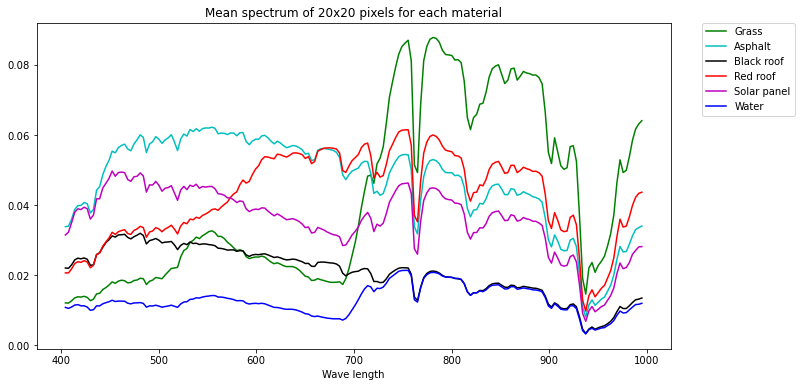

In [32]:
# Mean spectrum of 20x20 pixels for each material/region

grass1 = hyperim[402:422, 40:60, :].mean(axis = 0) # Grass
grass = grass1.mean(axis=0).reshape(-1,1) # Grass

asphalt1 = hyperim[250:270, 770:790, :].mean(axis = 0) # Asphalt 
asphalt = asphalt1.mean(axis=0).reshape(-1,1) # Asphalt 

black_roof1 = hyperim[720:740, 735:755, :].mean(axis = 0) # Black roof
black_roof = black_roof1.mean(axis=0).reshape(-1,1)  # Black roof

red_roof1 = hyperim[133:153, 886:906, :].mean(axis = 0) # Red roof
red_roof = red_roof1.mean(axis=0).reshape(-1,1) # Red roof

solar_panel1 = hyperim[405:415, 428:438, :].mean(axis = 0) # Solar panel
solar_panel = solar_panel1.mean(axis=0).reshape(-1,1) # Solar panel

water1 = hyperim[715:735, 900:920, :].mean(axis = 0) # Water
water = water1.mean(axis=0).reshape(-1,1) # Water

# Displaying the image
fig, ax_dict = plt.subplot_mosaic([ ['bottom', 'BLANK']], empty_sentinel="BLANK", figsize = (25, 6))

ax_dict['bottom'].plot(all_wavelengths,  grass, color = 'g', label='Grass')
ax_dict['bottom'].plot(all_wavelengths, asphalt, color = 'c', label='Asphalt')
ax_dict['bottom'].plot(all_wavelengths, black_roof, color = 'k',label='Black roof')
ax_dict['bottom'].plot(all_wavelengths,  red_roof, color = 'r', label='Red roof')
ax_dict['bottom'].plot(all_wavelengths, solar_panel, color = 'm', label='Solar panel')
ax_dict['bottom'].plot(all_wavelengths, water , color = 'b',label='Water')

ax_dict['bottom'].legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.title("Mean spectrum of 20x20 pixels for each material")
plt.xlabel("Wave length")
plt.show()

<center>Figure- 17: Mean spectrum of 20x20 pixels for each material</center>

#### Comment on the Spectra image with points vs  Mean spectrum of 20x20 pixels for each region
From the Figure-16 & Figure-17, we can see that the *Spectra image with points* and *Spectra image with 20x20 pixels* do not have any visible drastic changes, rather they look the same. It implies the range of pixels belonged to almost similar colors/materials. But when I have taken an area instead of only a pixel point, the curves have became slightly smoother.

<a id='E3c'></a>
# <font color='blue '>Exercise 3 (c): NDVI calculation & NDVI Image display <font>

##### NDVI index can be calculated in 2 ways:
- Method1: Manually using the red waveband and NIR waveband
- Method2: Using the built-in python function

#### NDVI calculating using the equation/formula

In [33]:
# NDVI calculating using the equation/formula
np.seterr(invalid='ignore') #ignoring the Nan values
ndvi_image_manual = (hyperim[:,:,NIR_band]-hyperim[:,:,red_band])/(hyperim[:,:,NIR_band]+hyperim[:,:,red_band])

#### NDVI calculating using the python function

In [34]:
# NDVI calculating using the python function 
np.seterr(invalid='ignore') #ignoring the Nan values
ndvi_image_python = ndvi(hyperim[:,:],red_band, NIR_band)

#### Displaying the NDVI images

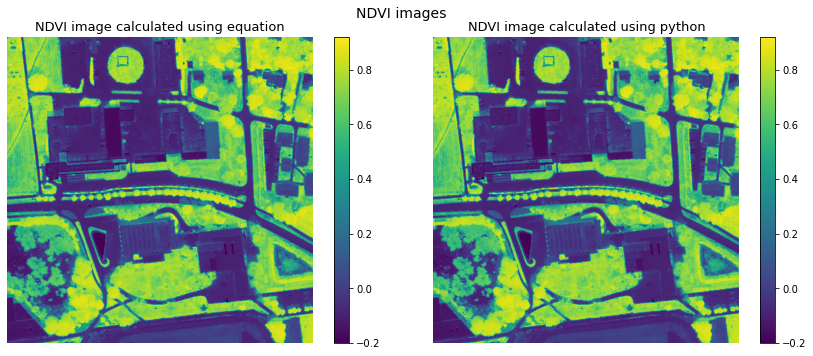

In [35]:
# Plotting the NVDI images
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (12, 5))
fig.suptitle("NDVI images", fontsize = 14)

# NDVI image calculated using equation
img1 = ax[0].imshow(ndvi_image_manual, vmin = -0.2, vmax = 0.92) 
ax[0].set_title("NDVI image calculated using equation", fontsize = 13)
plt.colorbar(img1, ax=ax[0])

# NDVI image calculated using python
img2 = ax[1].imshow(ndvi_image_python, vmin = -0.2, vmax = 0.92) 
ax[1].set_title("NDVI image calculated using python", fontsize = 13)
plt.colorbar(img2, ax=ax[1])

for a in ax:
    a.axis('off')    
    
fig.tight_layout()
plt.show()

<center>Figure- 18: NDVI images</center>


##### We know the following facts about the NDVI valus:
- High values (0.66 to 1) represent very healthy plants
- Moderate values (0.33 to 0.66) represent moderately healthy plants
- Very low values of NDVI (0.1 and below) correspond to barren areas of rock, sand, or snow. Negative values are often water.
- Source link: https://earthobservatory.nasa.gov/features/MeasuringVegetation

#### Comment on the NDVI images
From the Figure-18, we can see that the NDVI image calculated from both of the methods looks same. Depedning on their NVDI values, they have different colors in the image. Yellow is the highest with NDVI 1 (most healthy). The Objects and the almost dead plants have NDVI value below 0.3 which is represented by the darker colors. 

<a id='E3d'></a>
# <font color='blue '>Exercise 3 (d): Principal Component Analysis of the data<font>


At first, the PCA image has been created using 31 principal components (PCs) which explains 99.9% variance present in the image.
    
**Assuming, PC = Principal  Component**

### PCA calcualtion using 31 PCs (99.9% variance explained)

Number of PC's selected: 31


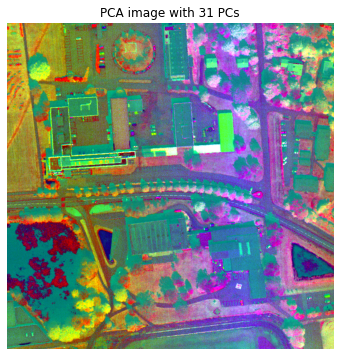

In [36]:
# PCA image creation with 31 PCs (99.9% variance explained)
pc = principal_components(hyperim)
pc_0999 = pc.reduce(fraction=0.999) # Select the PCs with 99.9% variance explained
img_31PCs = pc_0999.transform(hyperim)  # Then transforming to an image
print("Number of PC's selected:", img_31PCs.shape[2])

# Displaying the 31 PCs stacked image
imshow(img_31PCs, stretch=((0.03, 0.98),(0.03, 0.98),(0.03, 0.98)), figsize=(10,6), title ='PCA image with 31 PCs')
plt.axis('off')
plt.show()

<center>Figure- 19: PCA image with 31 PCs</center>

### Analysis of the PCA Score Plots and their corresponding Loading Plots images
Below the first 5 PCA score plots and their loading plots have been presented.

In [37]:
# Taking loadings from the PCA
loadings = pc_0999.eigenvectors 

In [38]:
# Function for displaying the score image and the loading plot for each PC
def display_score_plot_N_loading_plot(pc_no, loadings, image, vmin, vmax):
    fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (15, 5)) #(width,height)

    ax[0].imshow(img_31PCs[:,:,pc_no], vmin = vmin, vmax = vmax)
    ax[0].set_title('PC' + str(pc_no) + ' score image', fontsize = 13)

    ax[1].plot(all_wavelengths, loadings[:,[pc_no]])
    ax[1].set_title('PC' + str(pc_no) + ' loading plot', fontsize = 13)
    ax[1].set_xlabel('Wavelength', fontsize = 13)
    ax[1].set_ylabel('Intensity', fontsize = 13) 
    
    ax[0].axis('off')

    fig.tight_layout()
    plt.show()

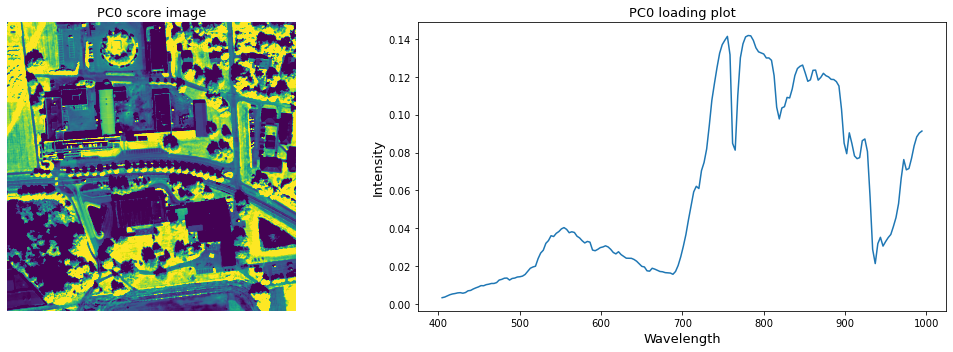

In [39]:
# For the PC0, generating the score plot and the loading plot 
display_score_plot_N_loading_plot(pc_no = 0,  loadings = loadings, image = img_31PCs, vmin = -0.2, vmax = 0.3)

<center>Figure- 20: PC0 score image and its corresponding loading plot</center>

### Comment on PC0:
From the Figure-20, we can understand the followings.
- **Score image**: Differentiates 3 groups:
    - Black roof tops, dark trees, vegetation in pond (represented in dark violet)
    - Grass & few trees (represented in yellow)
    - Rest (represented in green)
- **Loading plot**: 
   - PC0 has identified all the vegetations(both grass and trees). A typical vegetation loading plot can be observed which has high values starting after the red spectrum and continued till the NIR. It also has a peak at the green spectrum (490–575 nm) justifiying the reflection of green color by the vegetation. 

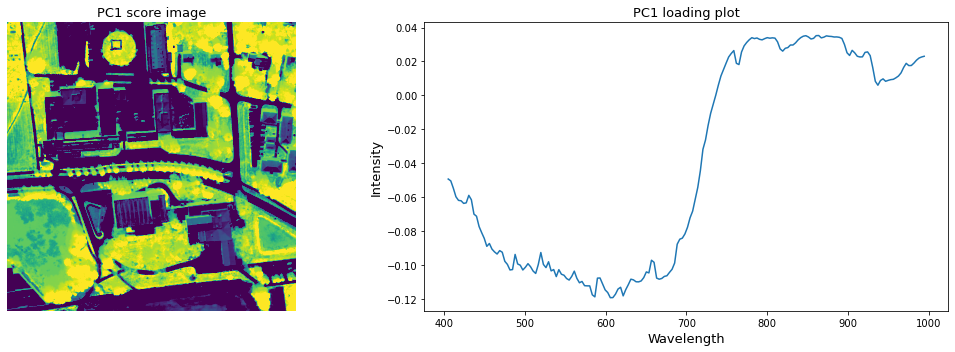

In [40]:
#For the PC1, generating the score plot and the loading plot 
display_score_plot_N_loading_plot(pc_no = 1,  loadings = loadings, image = img_31PCs, vmin=-0.09, vmax = 0.2)

<center>Figure- 21: PC1 score image and its corresponding loading plot</center>

### Comment on PC1:
From the Figure-21, we can understand the followings.
- **Score image**: Differentiates 3 groups:
    - Vegetation (grass, water based vegetation from the pond) (represented in yellowish green)
    - Gable shaped roofs & few small soil fields (represented in teal green/turquoise)
    - Rest (represented in dark violet)
- **Loading plot**:  
  - PC1 has identified all the vegetations(both grass and trees). A typical vegetation loading plot can be observed.

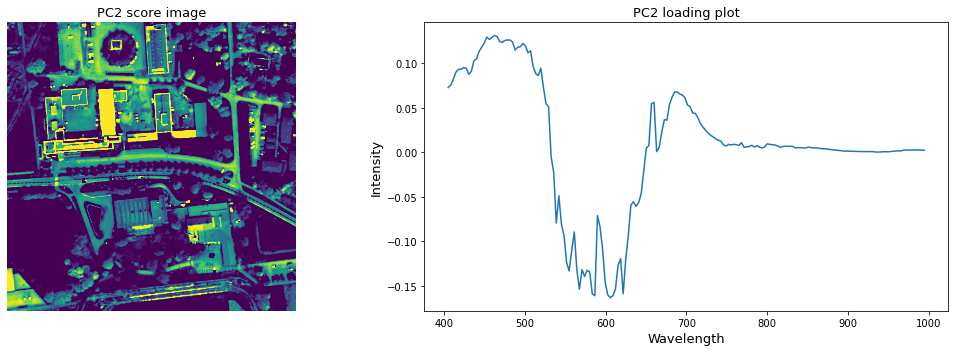

In [41]:
#For the PC2, generating the score plot and the loading plot 
display_score_plot_N_loading_plot(pc_no = 2,  loadings = loadings, image = img_31PCs, vmin=-0.007, vmax = 0.03)

<center>Figure- 22: PC2 score image and its corresponding loading plot</center>

### Comment on PC2:
From the Figure-22, we can understand the followings.
- **Score image**: Differentiates 3 groups: 
    - White roof tops (represented in yellow)
    - Concrete made roof tops and grounds, asphalt roads (represented in green)
    - Rest (vegetation & soil grounds) (represented in dark violet)
- **Loading plot**: 
  - All the vegetation has been identified in the dark violet/black color. So, a flipped peak at the green spectrum (490 to 575 nm) justifies the reflection of the green by the vegetation.

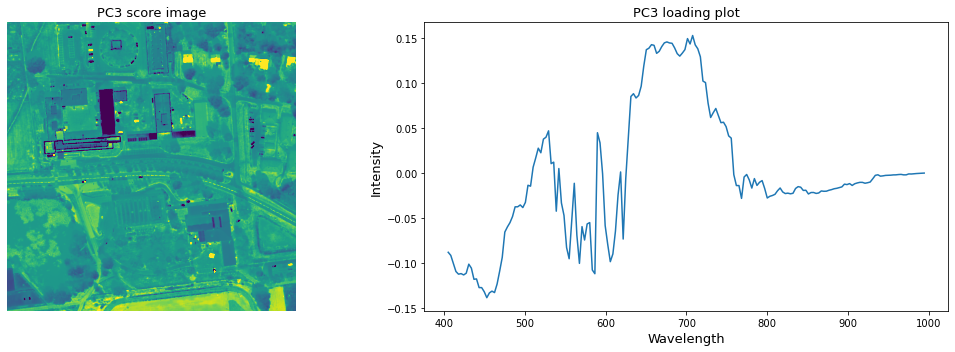

In [42]:
#For the PC3, generating the score plot and the loading plot 
display_score_plot_N_loading_plot(pc_no = 3,  loadings = loadings, image = img_31PCs, vmin=-0.06, vmax = 0.05)

<center>Figure- 23: PC3 score image and its corresponding loading plot</center>

### Comment on PC3:
From the Figure-23, we can understand the followings.
- **Score image**: Differentiates 3 groups: 
    - White roof tops (represented in dark violet)
    - Red roof tops (represented in yellow)
    - Rest (represented in green)
- **Loading plot**: Due to the reflectence of red color by the red roof tops, a peak in the red spectrum zone(650–750nm) is noticed.

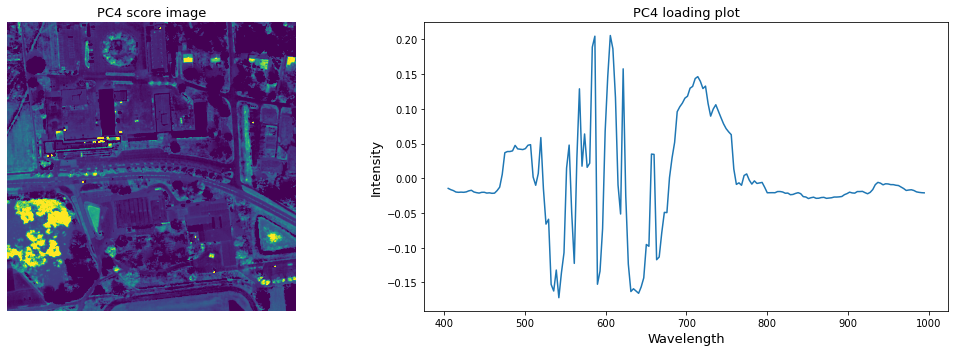

In [43]:
#For the PC4, generating the score plot and the loading plot 
display_score_plot_N_loading_plot(pc_no = 4,  loadings = loadings, image = img_31PCs, vmin = -0.003, vmax = 0.02)

<center>Figure- 24: PC4 score image and its corresponding loading plot</center>

### Comment on PC4:
From the Figure-24, we can understand the followings.
- **Score image**: Differentiates 3 groups: 
    - Green trees, vegetation in the pond, red roof tops (represented in yellow)
    - Dark trees, white roof tops (represented in dark violet)
    - Rest (represented in green)
- **Loading plot**: 
  - The identified vegetation in this zone might have high intensity in green color. The green color reflectence in the green sprectrum zone (490–575 nm) in this loading plot is quite high.

## Plotting the eigen values (PCA plot)

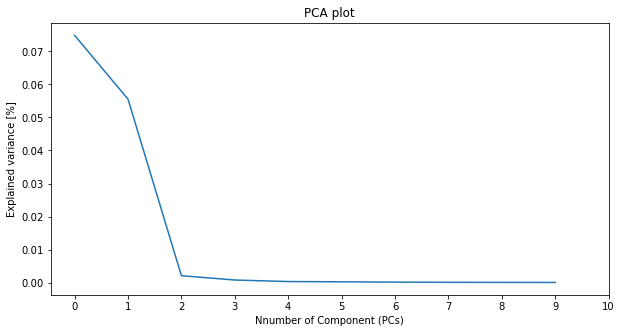

In [44]:
# Generating PCA plot to explain the variance present in the image
plt.figure(figsize=(10,5))
plt.plot(pc.eigenvalues[0:10])
plt.title("PCA plot")
plt.xlabel('Nnumber of Component (PCs)')
plt.ylabel('Explained variance [%]')
plt.xticks(np.arange(0,11,1))
plt.show()

<center>Figure- 25: Plotting the eigen values (PCA plot)</center>

### Comment on the PCA plot:
From the Figure-25, I have identified the following.
- **The break in the curve at component no 2** indicates the amount of components needed to explain the variance presssent in the image. In this case, it is the first 3 PCs.
- From the PCA plot, we can see that, according to the **"Elbow method"**, only the **1st three PCAs** are enough to explain the variance present in the image. But, there is a possibility that the rest of the PCs might have important informations. So, at first we should take more than 3 PCs to check whether they contain any relevant information. From our analysis of the score & loading plots of this image, we can this beyond the 1st three PCs, the PC3 and the PC4 also have important elements present. 

### Percentage of the variance explained by the PCs
- **1st 2 PCs (PC0 & PC1) explains 95% variance** present in the image [Shown in the code block below]
- **1st 3 PCs (PC0, PC1 & PC2) explains 97% variance** present in the image [Shown in the code block below]
- **To cover 99.9% variance**, we need the first **31 PCs** present in the image [Shown in the code block below]

In [45]:
# Percentage of PCs explained by the variance

# Taking 2 PCs
variance_explained = 0.95
pc_2 = pc.reduce(fraction = variance_explained)# select the PCs with 95.00% variance explained
img_2PCs = pc_2 .transform(hyperim) # then transforming to an image
print("Number of PC's selected (PC0 & PC1):", img_2PCs.shape[2])
print("Variance explained by 1st two PCs :", variance_explained*100, "%")
print("===========================================")

# Taking 3 PCs
variance_explained = 0.97
pc_3 = pc.reduce(fraction = variance_explained)# select the PCs with 97.00% variance explained
img_3PCs = pc_3 .transform(hyperim)  # then transforming to an image
print("Number of PC's selected (PC0, PC1 & PC2):", img_3PCs.shape[2])
print("Variance explained by 1st three PCs:", variance_explained*100, "%")
print("===========================================")

# Taking 31 PCs
variance_explained = 0.999
pc_31 = pc.reduce(fraction = variance_explained)# select the PCs with 99.9% variance explained
img_31PCs = pc_31 .transform(hyperim)  # then transforming to an image
print("Number of PC's selected:", img_31PCs.shape[2])
print("Variance explained by 31 PCs:", variance_explained*100, "%")

Number of PC's selected (PC0 & PC1): 2
Variance explained by 1st two PCs : 95.0 %
Number of PC's selected (PC0, PC1 & PC2): 3
Variance explained by 1st three PCs: 97.0 %
Number of PC's selected: 31
Variance explained by 31 PCs: 99.9 %


<a id='E3e'></a>
# <font color='blue '>Exercise 3 (e): Gaussian Maximum Likelihood Classification <font>


### Choosing area for each class and generating the ground truth image
For the GMLC algorithm, first we need to create the ground truth image. For the ground truth image, I have selected 7 areas belonging to 4 materials/classes present in the image.
- Vegetation
    - Grass
    - Dark tree
- Ground with soil
- Asphalt road
- Roofs
    - Black roof
    - Green roof
    - Red roof

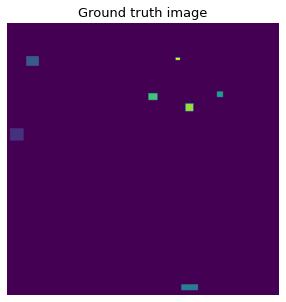

In [46]:
# Creating the ground truth image
shape = hyperim.shape
groundtruth = np.zeros([shape[0],shape[1]])
groundtruth[387:432, 11:61] = 1.0  #grass
groundtruth[122:157, 71:117] = 2.0  #dark tree
groundtruth[961:982, 641:702] = 3.0 #ground with soil
groundtruth[252:272, 772:794] = 4.0 #asphalt road
groundtruth[258:283, 520:553] = 5.0 #black roof
groundtruth[296:324, 656:685] = 6.0 #green roof
groundtruth[127:136, 620:636] = 7.0 #red roof

# Displaying the ground truth image
plt.subplots(1,1,figsize=(7,5))
plt.title(label = "Ground truth image", fontsize=13)
plt.imshow(groundtruth) 
plt.axis('off')
plt.show()

<center>Figure- 26: Ground truth image</center>

### Creating an image with the first 8 PCs (stack of 8 PCs) & applying GMLC
For applying the GMLC, I have created an image by selecting the first 8 PCs which covers 99.5% variance present in the hyperspectral image. 

Number of PC's selected: 8


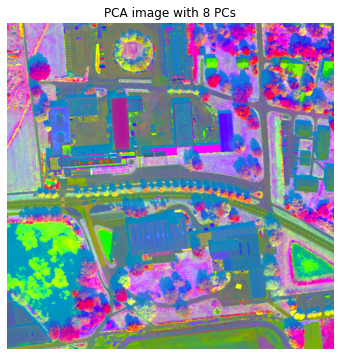

In [47]:
# PCA image creation with 8 PCs (99.5% variance explained)
pc_0995 = pc.reduce(fraction=0.995)
img_8PCs = pc_0995.transform(hyperim)
print("Number of PC's selected:", img_8PCs.shape[2])

# Displaying the 8 PCs stacked image
imshow(img_8PCs, stretch=((0.03, 0.96),(0.03, 0.96),(0.03, 0.96)), figsize=(10,6), title ='PCA image with 8 PCs')
plt.axis('off')
plt.show()

<center>Figure- 27: PCA image with 8 PCs</center>

In [48]:
# For stopping the spectral information printing
import logging, sys
logging.disable(sys.maxsize)

Processing...  0.0Processing... 14.3Processing... 28.6Processing... 42.9Processing... 57.1Processing... 71.4Processing... 85.7Processing... 100.Processing...done   


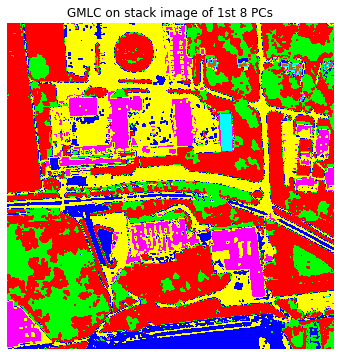

In [49]:
# GLMC on the Image with the stack of 8 PCs
classes = create_training_classes(img_8PCs, groundtruth)
gmlc = GaussianClassifier(classes)
clmap = gmlc.classify_image(img_8PCs)

imshow(classes = clmap, figsize = (6, 6))
plt.title("GMLC on stack image of 1st 8 PCs")
plt.axis('off')
plt.show()

<center>Figure- 28: GMLC on stack image of 1st 8 PCs</center>

### Applying GMLC on the complete hyperspectral image

Processing...  0.0Processing... 16.7Processing... 33.3Processing... 50.0Processing... 66.7Processing... 83.3Processing... 100.Processing...done   


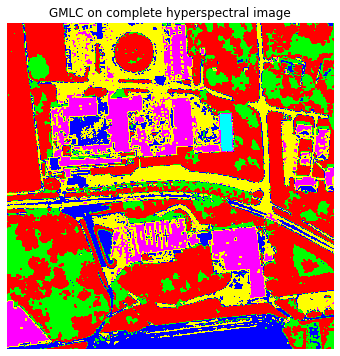

In [50]:
# Gaussian Maximum Likelihood Classification on the complete hyperspectral image
classes = create_training_classes(hyperim, groundtruth)
gmlc = GaussianClassifier(classes)
clmap = gmlc.classify_image(hyperim)

imshow(classes = clmap, figsize = (6, 6))
plt.title("GMLC on complete hyperspectral image")
plt.axis('off')
plt.show()

<center>Figure- 29: GMLC on complete hyperspectral image</center>

### Comment on the GMLC images:
From the Figure-28 and Figure-29, I have identified the followings.

**Similary between GMLC on complete hyperspectral image and stack of 8 PCs image**
- Sucessfully identified the vegetation(grass, trees, water plants), roof tops, and roads present in the image. 
  - The grass has been represented in red color. 
  - The trees and water plants have been represented in green/lemon color. 
  - The dark roof tops have been represented in Magenta color. 
  - The green roof top has been represented in Cyan color.
  - The red roof top has been represented in Brown color.
  - The The grounds with soil have presented in blue color. 
  - All the pavements/concrete parking plots/pathways and asphalt roads have represented in yellow color. 
- **Problem:** Water in the middle of the pond has been identified as grass. Except that no misclassifications have been identified

**Dissimilarity between GMLC on complete hyperspectral image and stack of 8 PCs image**
- GMLC on the Complete spectral image is much more detailed in terms of soil detection compared to the 8PCs image. 

<a id='E3f'></a>
# <font color='blue '>Exercise 3 (f): Outlining the vegetation using the edge detecting filters <font>


For applying the edge detection filters, we need an image where only the vegetation is visible. We know everything that has a NDVI value greater than or equal to 0.3 is considered vegetation. Thus, I have chosen 0.3 as the threshold value for having only the vegetation class.

### Generating an image with only the vegetation class (Thresholded NDVI)

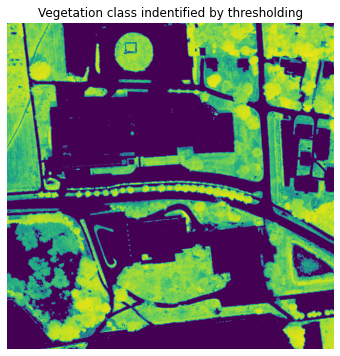

In [51]:
# Thresholding the NDVI image
threshold = 0.3 
thesrhold_ndvi = ndvi_image_python.copy()
thesrhold_ndvi[thesrhold_ndvi < threshold] = 0

# Displaying the NDVI image with only vegetation class
plt.subplots(1,1,figsize=(7,6))
plt.imshow(thesrhold_ndvi) 
plt.title("Vegetation class indentified by thresholding")
plt.axis('off')
plt.show()

<center>Figure- 30: Vegetation class indentified by thresholding</center>

### Detecting edges of the vegetation class
For detecting the edges, I have used 4 filters:
1. Prewitt
2. Sobel
3. Canny (using with sigma value 3)
4. Laplace

Since the edges detected by the filters were quite thin, for the better visualisation purpose, I have used the dilation  with square(2) and square(3) on all the edges for making them look thicker.

In [52]:
# Function for detecting edges from the given image
def edge_operator(image, operator):
    shape = np.shape(image)
    if len(shape) == 3:
        image = image.mean(axis=2)
    elif len(shape) > 3:
        raise ValueError('Must be at 2D image')
    
    filtered = None
    if operator == 1:
        filtered = filters.sobel(image)
    elif operator == 2:
        filtered = filters.prewitt(image) 
    elif operator == 3:
        filtered = feature.canny(image, sigma=3)        
    elif operator == 4:
        filtered = filters.laplace(image)
    else:
        return "you have given wrong operator"
     
    # Improving the thickness of the edges
    if operator != 3:
        for iteration in range(2):
            filtered = dilation(filtered, square(2))
    else:
        filtered = dilation(filtered, square(3))
    return filtered

# Function for displaying the results edges/outline of the vegetation
def show_edge_detection():
    fig, ax = plt.subplots(nrows = 2, ncols = 2, figsize = (9, 9))
    fig.suptitle("Vegetation outlined by the Edge detecting filters", fontsize = 13)    

    ax[0,0].imshow(sobel_edge, cmap='gray')
    ax[0,0].set_title('Sobel', fontsize = 12)

    ax[0, 1].imshow(prewitt_edge, cmap='gray')
    ax[0, 1].set_title(r'Prewitt', fontsize = 12)

    ax[1, 0].imshow(canny_edge, cmap='gray')
    ax[1, 0].set_title(r'Canny', fontsize = 12)

    ax[1, 1].imshow(laplace_edge, cmap='gray')
    ax[1, 1].set_title(r'Laplace', fontsize = 12)

    for row in ax:
        for col in row:
            col.axis('off')

    fig.tight_layout()
    plt.show()

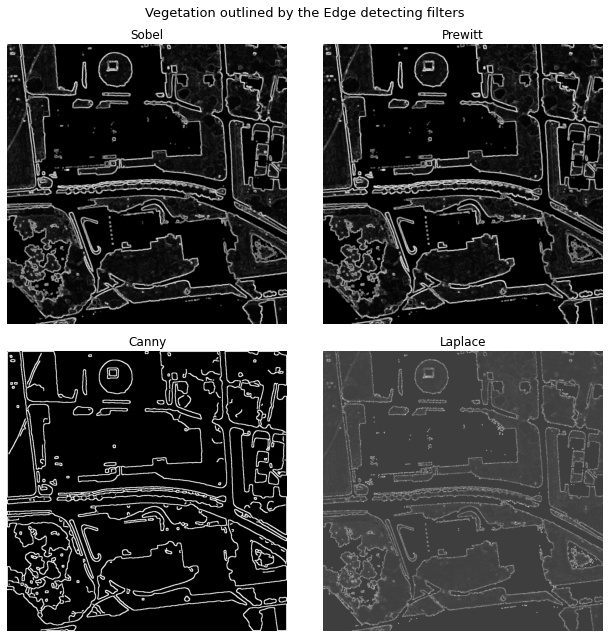

In [53]:
# Calling the edge detecting filters on the vegetation class
sobel_edge = edge_operator(thesrhold_ndvi, 1)
prewitt_edge = edge_operator(thesrhold_ndvi, 2)
canny_edge = edge_operator(thesrhold_ndvi, 3)
laplace_edge = edge_operator(thesrhold_ndvi, 4)

# Displaying the results of edge detection filter on  vegetaion class
show_edge_detection()

<center>Figure- 31: Vegetation outlined by the Edge detecting filters</center>

### Comment on the edge detecting filters on vegetation class. 
- From the Figure-31, we can see that 
  - The results of the Sobel and Prewitt on the vegetation class were almost similar. 
  - The Canny (with sigma value 3) had much more defiend edges and less noises compared to all the edge detecting filters [**Best**]
  - The Laplace had the **worst** result among the filters. 
  
Hence, for the overlaying purpose only the Sobel, Prewitt and Canny have been used.


### Outlining the vegetation using the edge detected images

Since the edges of the vegetation class has been identified in the white color(255) and the rest of the image is black(0), we can easily use the masking logic here. Hence, from both the images (edge detected and NDVI image) the maximum value for each pixel is taken for generating the new vegetation outlined image. Since the edges have the highest value(255) among the other pixels, the edges are preserved on the new generated image.

In [54]:
# Generating the overlay image/vegetation outlined image using 2 images: (1)Edge detected image and (2)NDVI image
def generate_overlay(edge_detected_image, NDVI_image):
    shape = np.shape(edge_detected_image)
    overlay_image = np.zeros([shape[0], shape[1]])
    
    #For each pixel taking the max value
    for i in range(shape[0]):
        for j in range(shape[1]):
            max_val = max(float(edge_detected_image[i,j]), float(NDVI_image[i,j]))
            overlay_image[i, j] = max_val   
            
    return overlay_image

# Displaying the vegetation outlined image
def display_overlay_images():
    fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (13, 5.5))
    fig.suptitle("Outlined vegetation by overlay", fontsize = 14)

    ax[0].imshow(sobel_overlay)
    ax[0].set_title('Sobel overlay', fontsize = 12)

    ax[1].imshow(prewitt_overlay)
    ax[1].set_title(r'Prewitt overlay', fontsize = 12)

    ax[2].imshow(canny_overlay)
    ax[2].set_title(r'Canny overlay', fontsize = 12)

    for a in ax:
        a.axis('off')

    fig.tight_layout()
    plt.show()

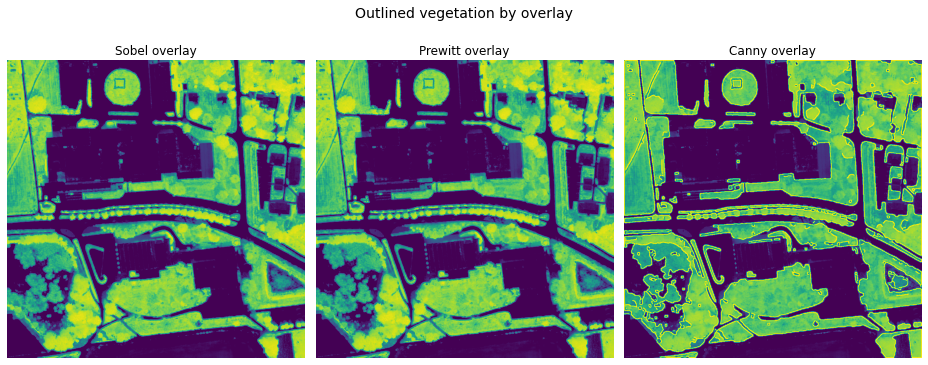

In [55]:
# Generating overlays for each edge detected image
sobel_overlay = generate_overlay(sobel_edge, ndvi_image_python)
prewitt_overlay = generate_overlay(prewitt_edge, ndvi_image_python)
canny_overlay = generate_overlay(canny_edge, ndvi_image_python)

# Displaying the overlayed/vegetation outlined images
display_overlay_images()

<center>Figure- 32: Outlined vegetation by overlay</center>

### Comment on the vegetation outlining: 
From the Figure- 32, we can see that-
- The Sobel and Prewitt version of the outlined images have the same results because their edge detecting styles were similar.
- The Canny has the **best** outlined image and it also **matched with the sample image** of the question.